In [60]:
import os
import json

from transformers import PatchTSTConfig, PatchTSTModel
from transformers import PatchTSTForPretraining, PatchTSTForPrediction, PatchTSTForRegression
from transformers import InformerConfig, InformerModel
# from transformers import InformerForRegression

from matplotlib.pyplot import text

from skllm.config import SKLLMConfig
from skllm.models.gpt.classification.zero_shot import ZeroShotGPTClassifier, MultiLabelZeroShotGPTClassifier
from skllm.models.gpt.classification.few_shot import FewShotGPTClassifier, MultiLabelFewShotGPTClassifier
from skllm.models.gpt.classification.few_shot import DynamicFewShotGPTClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import precision_score, recall_score, mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
from sklearn.metrics import f1_score, balanced_accuracy_score
from sklearn import linear_model
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.svm import NuSVR
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor

from transformers import TimeSeriesTransformerConfig, TimeSeriesTransformerModel

import xgboost as xgb

from datetime import datetime
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import pandas as pd
import scipy.sparse as sp

import torch as th
import torch.nn as nn
import torch.nn.functional as F

from tqdm import tqdm

import pickle

from torch_geometric.data import Data
from torch_geometric_temporal.nn import STConv, TemporalConv, DCRNN, TGCN, GCLSTM
from dgl.nn import SAGEConv, GATConv, ChebConv, SGConv, PNAConv, GMMConv, TAGConv
import networkx as nx

from matplotlib import pyplot as plt
import seaborn as sns

import warnings

from gluonts.dataset.common import ListDataset
from gluonts.evaluation.backtest import make_evaluation_predictions
from gluonts.torch.model.patch_tst import PatchTSTEstimator
from gluonts.torch.model.d_linear import DLinearEstimator
from gluonts.torch.model.tft import TemporalFusionTransformerEstimator
from gluonts.dataset.field_names import FieldName

from gluonts.evaluation import Evaluator

from finch import FINCH



warnings.filterwarnings('ignore')
SKLLMConfig.set_openai_key(os.environ["OPENAI_API_KEY"])

np.random.seed(1024)
th.manual_seed(1024)

In [2]:
from gluonts.torch.model.d_linear import DLinearEstimator

In [3]:
from gluonts.dataset.repository import get_dataset, dataset_names
from gluonts.dataset.util import to_pandas

In [4]:
hyperparameterstorage = None
with open("/home/etienne/hyperparameterstorage.json", "r") as read_file:
    hyperparameterstorage = json.load(read_file)

In [5]:
# Definition of a binary activation function 
# The function will be exploited in some of the graph-based models to binarize node attributes

class custom_activation(nn.Module):
    def __init__(self, threshold):
        super(custom_activation, self).__init__()
        self.threshold = threshold

    def forward(self, x):
        x[x >= self.threshold] = 1
        x[x < self.threshold] = 0
        return x

Proposed learning phase
==

1- Graph autoregression
--

In [6]:
# In the below proposed autoencoder, 
#   the decoder just acts as a function 
#   enabling the generation of node attributes

class gnn_net(nn.Module):
    
    def __init__(self, in_feat, hidden_feat, k=1, aggregator='pool', name='TAG'):
        super(gnn_net,self).__init__()
        self.projector = nn.ModuleList()
        if name == 'TAG':
            self.projector.append(TAGConv(in_feat, hidden_feat[0], k))
            for i in range(1, len(hidden_feat)):
                self.projector.append(TAGConv(hidden_feat[i - 1], hidden_feat[i], k))
        if name == 'SAGE':
            self.projector.append(SAGEConv(in_feat, hidden_feat[0], aggregator))
            for i in range(1, len(hidden_feat)):
                self.projector.append(SAGEConv(hidden_feat[i - 1], hidden_feat[i], aggregator))
    def forward(self, g, X):
        h = X
        for i, layer in enumerate(self.projector):
            h = layer(g, h)
            h = F.dropout(F.relu(h))
        return h

class autoencoder2(nn.Module):
    def __init__(
            self,
            in_feats_encoder,
            hidden_feats_encoder,
            k,
            graph_lag,
            hidden_feats_node_decoder,
            dropout=0.1,
            threshold=.5
    ):
        super(autoencoder2, self).__init__()
        self.dropout = dropout
        self.activation = custom_activation(threshold)
        self.threshold = threshold

        # Encoder model
        self.encoder = nn.ModuleList()

        for i in range(graph_lag):
            net = gnn_net(in_feats_encoder, hidden_feats_encoder, k)
            if i == graph_lag - 1:
                self.encoder.append(nn.Linear(hidden_feats_encoder[-1] * (i), 
                                              hidden_feats_encoder[-1], bias=False))
            self.encoder.append(net)

        # Decoder model

        ## Node decoder
        self.decod_node_layers = nn.ModuleList()

        self.decod_node_layers.append(nn.Linear(hidden_feats_encoder[-1] * graph_lag, 
                                                hidden_feats_node_decoder[0], bias=False))

        for i in range(1, len(hidden_feats_node_decoder)):
            self.decod_node_layers.append(nn.Linear(hidden_feats_node_decoder[i - 1],
                                                    hidden_feats_node_decoder[i]))

        self.reset_parameters()

    def reset_parameters(self):
        gain = nn.init.calculate_gain('relu')
        for layer in self.decod_node_layers:
            nn.init.xavier_uniform_(layer.weight, gain=gain)

        nn.init.xavier_uniform_(self.encoder[-2].weight, gain=gain)
        
    def edge_construction(self, feat_node):
        n = int(feat_node.shape[0]/2)
        val = []
        for i in range(n):
            vec1 = feat_node[i,:]
            for j in range(n, feat_node.shape[0]):
                vec2 = feat_node[j,:]
                test = False
                for el in vec1 + vec2:
                    if el > 1:
                        val.append(1)
                        test = True
                        break
                if test == False:
                    val.append(0)
        return th.tensor(val)

    def forward(self, list_g, list_features):

        # Encoding the subsequent graphs
        whole = []
        embeddings = []
        count = 0
        for g, X in zip(list_g[0:-1], list_features[0:-1]):
            h = self.encoder[count](g, X)
            embeddings.append(h)
            whole.append(h)
        whole.append(self.encoder[-2](th.cat(embeddings, 1)))
        h = self.encoder[-1](list_g[-1], list_features[-1])
        embeddings.append(h)
        whole.append(h)

        # Graph construction
        h_node_embeddings = th.cat(embeddings, 1)
        h_edge_embeddings = []
        for i in range(int(len(h_node_embeddings) / 2)):
            for j in range(int(len(h_node_embeddings) / 2), len(h_node_embeddings)):
                vec = th.cat([h_node_embeddings[i, :].reshape(1, -1), h_node_embeddings[j, :].reshape(1, -1)], 1)
                h_edge_embeddings.append(vec)
        h_edge_embeddings = th.cat(h_edge_embeddings, 0)

        ## node construction
        h_node_features = h_node_embeddings
        for i, layer in enumerate(self.decod_node_layers):
            h_node_features = layer(h_node_features)
            h_node_features = F.dropout(self.activation(h_node_features), p=self.dropout)
        
        ## edge construction
        h_edges = self.edge_construction(h_node_features)

        return h_node_embeddings,whole, h_node_features, h_edges
    
def train_net2(
    list_graphs, graph_lag, device,model, epochs=100, lr=0.005, weight_decay=0.005,
              loss_encod = F.l1_loss, loss_node = F.mse_loss, loss_edge = F.l1_loss):
    optimizer = th.optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
    losses = {}
    losses['encoder'] = []
    losses['node_decoder'] = []
    losses['edge_decoder'] = []
    losses['merge'] = []
    activation = lambda x: th.where(x > 0.55, 1., 0.)
    activation2 = lambda x: th.where(x > 0.267, x, 0.)

    inputs, target_node_features, target_edges = [], [], []
    for i in range(len(list_graphs)-graph_lag):
        seq = list_graphs[i:i+graph_lag]
        gr = list_graphs[i+graph_lag]
        inputs.append(seq)
        target_node_features.append(gr.ndata['features'].to(device=device, dtype=th.float))
        w = th.zeros(int(gr.num_nodes()/2)**2).to(device=device, dtype=th.float)
        from_ = gr.edges()[0].tolist()
        to_ = gr.edges()[1].tolist()
        posi = []
        edge_posi = [(a,b) for a, b in zip(from_, to_)]
        for a in range(int(gr.num_nodes()/2)):
            for b in range(int(gr.num_nodes()/2), gr.num_nodes()):
                posi.append((a,b))
        for a, b in zip(from_, to_):
#             w[posi.index((a,b))] = gr.edata['weight'][edge_posi.index((a,b))]
            w[posi.index((a,b))] = 1.
        target_edges.append(w)

    model.train()
    for e in tqdm(range(epochs)):
        test = False
        for i, list_g in enumerate(inputs):
            list_feat = []
            for gr in list_g:
                feat = gr.ndata['features'].to(device=device, dtype=th.float)
                list_feat.append(feat)
            h_node_embeddings, whole, h_node_features, h_edges = model(list_g, list_feat)
            loss0 = loss_encod(whole[-2], whole[-1])
            loss1 = loss_node(h_node_features.flatten(), target_node_features[i].flatten())
#             loss1 = loss_node(activation(h_node_features).flatten(), target_node_features[i].flatten())
            loss2 = loss_edge(h_edges.to(device=device, dtype=th.float), target_edges[i])
            loss = loss0 + loss1 + loss2
            losses['encoder'].append(loss0.item())
            losses['node_decoder'].append(loss1.item())
            losses['edge_decoder'].append(loss2.item())
            losses['merge'].append(loss.item())

            # Backward
            optimizer.zero_grad()
            loss0.backward(retain_graph=True)
            loss1.backward(retain_graph=True)
#             loss2.backward(retain_graph=True)
            loss.backward()
            optimizer.step()
            if loss2.item()<= 0.005:
                test = True
                break

        if e % 10 == 0:
            print(
                'In epoch {}, node_encoder:{:.5f}, node_decoder: {:.5f}, edge_decoder: {:.5f}, whole_loss: {:.5f}'.format(
                    e, loss0, loss1, loss2, loss))
        if test:
            break
    return losses

def node_prediction(list_true_node_features, list_predicted_node_features):

    pred = list_predicted_node_features.detach().numpy()
    true = list_true_node_features.detach().numpy()
    error_node_features = {}
    error_node_features['MSE'] = np.zeros(len(list_true_node_features))
    error_node_features['MAE'] = np.zeros(len(list_true_node_features))
    error_node_features['MAPE'] = np.zeros(len(list_true_node_features))
    
    for i in range(len(list_true_node_features)):
        error_node_features['MSE'][i] = mean_squared_error(true[i,:], pred[i,:])
        error_node_features['MAE'][i] = mean_absolute_error(true[i,:], pred[i,:])
        error_node_features['MAPE'][i] = mean_absolute_percentage_error(true[i,:], pred[i,:])
        
    return pd.DataFrame(error_node_features)
    
def view_training_loss(dico):
    fig = plt.figure(dpi=120, figsize=(24, 6))
    l = min([len(val) for val in dico.values()])
    dico2 = {}
    for k,v in dico.items():
        dico2[k] = v[0:l]
    data = pd.DataFrame(dico2)
    for i, name in enumerate(list(data)):
        axe = fig.add_subplot(1, 4, i+1)
        sns.lineplot(data=data[name], ax=axe)
    plt.show()

2- Graph serialization 
--

In [7]:
def serializegraph(patterns_, list_graphs, series, steps,data):
    fig = plt.figure(dpi=125, figsize=(8, 8.5))
    v1, v2 = steps[0].split('-')[0], steps[-1].split('-')[-1]
    promptdata = '---- Trajectory followed by series '+series+' from '+ r'$T_{'+v1+'}$ to'+r'$T_{'+v2+'}$ ----\n\n'
    for c, step in enumerate(steps):
        t1, t2 = step.split('-')
        track_ = {}
        for model in patterns_:
            for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                if series in voters:
                    track_[step] = model
        v1 = track_[int(t1)].replace('model','')
        v2 = track_[int(t2)].replace('model','')
        promptdata += r'$ '+str(c+1)+'- From \; T_{'+t1+'} \; to\;  T_{'+t2+'}$, \n'
        temp = ''
        if v1 == v2:
            if c == 0:
                promptdata += 'time series '+series+' presenting pattern '+ r'$\Theta^{'+v1+'}$ at '+r'$T_{'+t1+'}$ preserves the same pattern at '+r'$T_{'+t2+'}$.' 
            else:
                promptdata += 'At the next time interval '+r'$T_{'+t2+'}$, the series continued presenting the same pattern.'
        else:
            seri = ''
            for ser in list(data):
                if ser != series:
                    track2_ = {}
                    for model in patterns_:
                        for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                            if ser in voters:
                                track2_[step] = model
                    if track2_[int(t1)] == track_[int(t2)]:
                        seri += ', '+ser+'\n'
            if c == 0:
                promptdata += 'time series '+series+' presenting pattern '+ r'$\Theta^{'+v1+'}$ at '+r'$T_{'+t1+'}$ started presenting pattern '+r'$\Theta^{'+v2+'}$  at '+r'$T_{'+t2+'}$ due to time series'+seri+'.' 
            else:
                promptdata += 'At the next time interval '+r'$T_{'+t2+'}$, it switches from pattern '+ r'$\Theta^{'+v1+'}$ to pattern '+r'$\Theta^{'+v2+'}$ due to time series '+seri+'.'
        promptdata += '\n\n'
    promptdata += '\n Based on the above information, will time series '+series+'\n switch at the next time interval?'
    promptdata += '\n\n\n --------------------------------\n\n\n Answer: '
    ax = fig.add_subplot(111)
    ax.text(.01, .15, promptdata,ha='left',size=16, wrap=True)
    ax.set_xticklabels('')
    ax.set_yticklabels('')
    
    # Selecting the axis-X making the bottom and top axes False. 
    plt.tick_params(axis='x', which='both', bottom=False, 
                    top=False, labelbottom=False) 

    # Selecting the axis-Y making the right and left axes False 
    plt.tick_params(axis='y', which='both', right=False, 
                left=False, labelleft=False) 
    for pos in ['right', 'top', 'bottom', 'left']: 
        plt.gca().spines[pos].set_visible(False) 
    plt.show()
    return promptdata

def getTextReview(
    patterns_, 
    list_graphs, 
    k,
    data
):
    p = k+1
    dataout = {}
    dataout['targetSeries'] = []
    dataout['timeInterval'] = []
    dataout['switchPattern'] = []
    dataout['eventUnderwent'] = []
    dataout['eventUnderwent2'] = []
    dataout['finalEvent'] = []
    dataout['incidentSeries'] = []
    steps = list(list_graphs.keys())
    for i in range(len(steps)-p+1):
        substeps = steps[i:i+p]
        for series in list(data):
            events = ''
            final = ''
            dataout['targetSeries'].append(series)
            dataout['timeInterval'].append(substeps[0]+' to '+substeps[-1])
            for c, step in enumerate(substeps):
                temp = ''
                t1, t2 = step.split('-')
                temp += 'From T'+t1+' to T'+t2+', '
                track_ = {}
                for model in patterns_:
                    for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                        if series in voters:
                            track_[step] = model
                v1 = track_[int(t1)]
                v2 = track_[int(t2)]
                if v1 == v2:
                    temp += series+' kept on exhibiting pattern '+v1
                else:
                    seri = ''
                    for ser in list(data):
                        if ser != series:
                            track2_ = {}
                            for model in patterns_:
                                for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                                    if ser in voters:
                                        track2_[step] = model
                            if track2_[int(t1)] == track_[int(t2)]:
                                seri += ser+', '
                    temp += series+' that was presenting pattern '+v1+' is now presenting pattern '+v2+' due to series '+seri+'. '
                if c < len(substeps)-1:
                    events += temp
                else:
                    final += temp
            if 'kept on exhibiting pattern' in final:
                dataout['switchPattern'].append(0)
                dataout['incidentSeries'].append(series)
            else:
                dataout['switchPattern'].append(1)
                dataout['incidentSeries'].append(seri)
            dataout['eventUnderwent'].append(events+' At the next timestamp what pattern will be exhibited?')
            dataout['eventUnderwent2'].append(events+' At the next timestamp which series may influence its evolution?')
            dataout['finalEvent'].append(v2)
    return pd.DataFrame(dataout)

def getSerialization(dependencies, coevoldata, listpatterns):
    seriesname = list(coevoldata)
    serialization = {}
    serialization['targetSeries'] = []
    serialization['From'] = []
    serialization['To'] = []
    serialization['startingEvent'] = []
    serialization['endingEvent'] = []
    for intervals in dependencies:
        t1, t2 = intervals.split('-')
        mat = dependencies[intervals]['dgl_graph'].ndata['features'].detach().numpy()
        mat1, mat2 = mat[0:int(mat.shape[0]/2),:], mat[int(mat.shape[0]/2):, :]
        mat3 = mat1 + mat2
        for i in range(mat3.shape[0]): # patterns
            for j in range(mat3.shape[1]): # series
                if mat3[i,j] == 2:
                    serialization['targetSeries'].append(seriesname[j])
                    serialization['From'].append('T'+t1)
                    serialization['To'].append('T'+t2)
                    serialization['startingEvent'].append(listpatterns[i])
                    serialization['endingEvent'].append(listpatterns[i])
                if mat3[i,j] == 1.:  # either mat1[i,j] = 1  or mat2[i,j] = 1
#                     print (i, j, mat1[i,j], mat2[i,j])
                    serialization['targetSeries'].append(seriesname[j])
                    serialization['From'].append('T'+t1)
                    serialization['To'].append('T'+t2)
                    if mat2[i,j] == 1.:
#                         print(mat2[i,j], mat1[i,j])
                        serialization['endingEvent'].append(listpatterns[i])
                        for k in range(len(mat1)):
                            if mat1[k,j] == 1.:
                                serialization['startingEvent'].append(listpatterns[k])
                                break
                    else :
                        serialization['startingEvent'].append(listpatterns[i])
#                         print(mat3[:,j].sum())
                        for k in range(mat3.shape[0]):
                            if mat2[k,j] == 1.:
                                serialization['endingEvent'].append(listpatterns[k])
                                break
    basic = pd.DataFrame(serialization).drop_duplicates()
    
    return basic

def getTextReview2(
    dependencies, 
    coevoldata, 
    listpatterns,
    k = 1
):
    def readRow(row, last=False):
        line = ''
        if last == False:
            if row[-2] == row[-1]:
                line += 'From '+row[1]+' to '+row[2]+' series '+row[0]+' presented the same pattern '+row[-1]
            else:
                line += 'From '+row[1]+' to '+row[2]+' series '+row[0]+' that was presenting pattern '+row[-2]+' is now presenting pattern '+row[-1]
        else:
            line += 'Now that at '+row[1]+', series '+row[0]+' presented pattern '+row[-2]+' what will the next exhibited pattern at '+row[2]+'?'
        return line

    basicserial = getSerialization(dependencies, coevoldata, listpatterns)
    
    
    dataout = {}
    dataout['targetSeries'] = []
    dataout['timeInterval'] = []
    dataout['switchPattern'] = []
    dataout['eventUnderwent'] = []
    dataout['finalEvent'] = []
    dataout['targetTime'] = []
    p = k+1 
    
    for s in list(coevoldata):
        subfr = basicserial[basicserial.targetSeries == s]
        for q in range(0, len(subfr)-p):
            df = subfr.iloc[q:q+p,:]
            mate = df.values
            para = ''
            s = df.targetSeries.values[0]
            t1 = df.From.values[0]
            t2 = df.To.values[-1]
            start = df.startingEvent.values[0]
            end = df.endingEvent.values[-1]
            dataout['targetTime'].append(int(t2.replace('T','')))
            dataout['targetSeries'].append(s)
            dataout['timeInterval'].append(t1+' to '+t2)
            dataout['finalEvent'].append(end)
            if start == end:
                dataout['switchPattern'].append(0)
            else:
                dataout['switchPattern'].append(1)
            for r in range(len(mate)):
                if r < len(mate)-1:
                    para += '\n '+readRow(mate[r,:])
                else:
                    para += '\n '+readRow(mate[r,:], last=True)
            dataout['eventUnderwent'].append(para)
    return dataout

def getTextReviewPrediction(currentReview, currentstep, sampledata, predictedlabels, targetseries):
    frame = currentReview.copy()
    frame['switchPatternPrediction'] = predictedlabels
    frame['incidentSeriesPrediction'] = []
    vec = []
    for val in predictedlabels:
        if val == 0:
            vec.append(targetseries)
        else:
            temp = ''
            t1, t2 = currentstep.split('-')
            temp += 'From T'+t1+' to T'+t2+', '
            track_ = {}
            for model in patterns_:
                for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                    if series in voters:
                        track_[currentstep] = model
            v1 = track_[int(t1)]
            v2 = track_[int(t2)]
            if v1 == v2:
                temp += series+' kept on exhibiting pattern '+v1
            else:
                seri = ''
                for ser in list(data):
                    if ser != series:
                        track2_ = {}
                        for model in patterns_:
                            for step, voters in zip(patterns_[model]['steps'], patterns_[model]['voters']):
                                if ser in voters:
                                    track2_[step] = model
                        if track2_[int(t1)] == track_[int(t2)]:
                            seri += ser+', '
                vec.append(seri)
    frame['incidentSeriesPrediction'] = vec
    return frame

def getZeroShotModel(labels):
    binaryclf1 = MultiLabelZeroShotGPTClassifier(
                openai_model="gpt-3.5-turbo"
            )
    binaryclf2 = MultiLabelZeroShotGPTClassifier(
            openai_model="gpt-4"
        )
    binaryclf3 = MultiLabelZeroShotGPTClassifier(
            openai_model="davinci-002"
        )
    binaryclf1.fit(None, [labels])
    binaryclf2.fit(None, [labels])
    binaryclf3.fit(None, [labels])
    return binaryclf1, binaryclf2, binaryclf3
            
def getFewShotModel(examples, labels):
    binaryclf1 = DynamicFewShotGPTClassifier(
            openai_model="gpt-3.5-turbo"
        )
    binaryclf2 = DynamicFewShotGPTClassifier(
            openai_model="gpt-4"
        )
    binaryclf3 = DynamicFewShotGPTClassifier(
            openai_model="davinci-002"
        )
    binaryclf1.fit(examples, labels)
    binaryclf2.fit(examples, labels)
    binaryclf3.fit(examples, labels)
    return binaryclf1, binaryclf2, binaryclf3

def getPrediction(frame, examples=None, labels=None):
    # If examples is None then is Zero-shot setting 
    # With more than one example we have a Few-shot setting.
    
#     labels = list(frame.finalEvent.unique())
    prediction = {}
    prediction['GPT3'] = []
    prediction['GPT4'] = []
    prediction['DAVINCI'] = []
#     prediction['Multi-GPT3'] = []
#     prediction['Multi-GPT4'] = []
    
    binaryclf1 = None
    binaryclf1 = ZeroShotGPTClassifier(openai_model="gpt-3.5-turbo")
    if examples is None:
        binaryclf1.fit(examples, ['yes', 'no'])
    else:
#         binaryclf1 = FewShotGPTClassifier(openai_model="gpt-3.5-turbo")
        binaryclf1 = DynamicFewShotGPTClassifier(
            openai_model="gpt-3.5-turbo", 
            n_examples=3,
            batch=20
        )
        binaryclf1.fit(examples, labels)
    binaryclf2 = None
    binaryclf2 = ZeroShotGPTClassifier(openai_model="gpt-4")
    if examples is None:
        binaryclf2.fit(examples, ['yes', 'no'])
    else:
#         binaryclf2 = FewShotGPTClassifier(openai_model="gpt-4")
        binaryclf2 = DynamicFewShotGPTClassifier(
            openai_model="gpt-4", 
            n_examples=3,
            batch=20
        )
        binaryclf2.fit(examples, labels)
    multiclf1 = None 
    multiclf1 = MultiLabelZeroShotGPTClassifier(openai_model="gpt-3.5-turbo", max_labels=len(labels))
    multiclf1.fit(examples, labels)
    multiclf2 = None
    multiclf2 = MultiLabelZeroShotGPTClassifier(openai_model="gpt-4", max_labels=len(labels))
    multiclf2.fit(examples, labels)
    
    for i, val in enumerate(frame.eventUnderwent):
        # First level prediction
        pred1 = binaryclf1.predict([val.replace('what pattern will be exhibited?', 'will the series switch pattern?')])
        pred2 = binaryclf2.predict([val.replace('what pattern will be exhibited?', 'will the series switch pattern?')])
        if pred1[0] == 'yes':
            # Second level prediction
            prediction['GPT3'].append(1)
#             p = multiclf1.predict([val])
#             prediction['Multi-GPT3'].append(p)
        else:
            prediction['GPT3'].append(0)
#             prediction['Multi-GPT3'].append(frame.finalEvent.values.flatten()[i])
        if pred2[0] == 'yes':
            # Second level prediction
            prediction['GPT4'].append(1)
#             p = multiclf2.predict([val])
#             prediction['GPT4'].append(p)
        else:
            prediction['GPT4'].append(0) 
#             prediction['Multi-GPT4'].append(frame.finalEvent.values.flatten()[i])
#     prediction['True'] = frame.eventUnderwent.values.flatten()
#     prediction['True-Models'] = frame.finalEvent.values.flatten()
    
    return prediction

# candidate_labels = ["Action", "Comedy", "Drama", "Horror", "Sci-Fi"]
# multi_label_zero_shot_clf = MultiLabelZeroShotGPTClassifier(max_labels=2)
# multi_label_zero_shot_clf.fit(X_train, candidate_labels)
# multi_label_zero_shot_predictions = multi_label_zero_shot_clf.predict(X_test)

# # Convert the labels to binary array format using MultiLabelBinarizer
# mlb = MultiLabelBinarizer()
# y_test_binary = mlb.fit_transform(y_test)
# multi_label_zero_shot_predictions_binary = mlb.transform(multi_label_zero_shot_predictions)

# # Print Multi-Label Zero-Shot Text Classification Report
# print("Multi-Label Zero-Shot Text Classification Report:")
# print(classification_report(y_test_binary, multi_label_zero_shot_predictions_binary))

def getllmRegression2(toregress, patterns_, past_values, current_values):
    resultsgpt4 = {}
    resultsgpt4['series'] = []
    resultsgpt4['MSE'] = []
    resultsgpt4['MAE'] = []
    resultsgpt4['MAPE'] = []
    resultsgpt3 = {}
    resultsgpt3['series'] = []
    resultsgpt3['MSE'] = []
    resultsgpt3['MAE'] = []
    resultsgpt3['MAPE'] = []
    resultsdavinci = {}
    resultsdavinci['series'] = []
    resultsdavinci['MSE'] = []
    resultsdavinci['MAE'] = []
    resultsdavinci['MAPE'] = []
    h = past_values
    for el1, el2, el3, series in zip(toregress.GPT3, toregress.GPT4, toregress.DAVINCI, toregress.series):
        resultsgpt3['series'].append(series)
        resultsgpt4['series'].append(series)
        resultsdavinci['series'].append(series)
        model1 = patterns_[el1]['model']
        model2 = patterns_[el2]['model']
        model3 = patterns_[el3]['model']
        seriestest = past_values[series].values.flatten()
        X_test, y_test = reshapeSeries(seriestest, 3)
        h1 = X_test[0,:].flatten()
        h2 = X_test[0,:].flatten() 
        h3 = X_test[0,:].flatten() 
        pred1 = []
        pred2 = []
        pred3 = []
        for i in range(len(current_values)):
            yhat1 = model1.predict(h1.reshape(1,-1))
            yhat2 = model2.predict(h2.reshape(1,-1))
            yhat3 = model3.predict(h3.reshape(1,-1))
            h1[0:-1] = h1[1:]
            h1[-1] = yhat1[0]
            pred1.append(yhat1[0])
            h2[0:-1] = h2[1:]
            h2[-1] = yhat2[0]
            pred2.append(yhat2[0])
            h3[0:-1] = h3[1:]
            h3[-1] = yhat3[0]
            pred3.append(yhat3[0])
        # print(len(pred1), len(pred2), len(current_values))
#         v = current_values[series].values.flatten()
#         plt.plot(pred1,'r--')
#         plt.plot(v)
#         plt.show()
#         break
        err1 = node_prediction(th.tensor(pred1).reshape(-1,1), th.tensor(v).reshape(-1,1))
        err2 = node_prediction(th.tensor(pred2).reshape(-1,1), th.tensor(v).reshape(-1,1))
        err3 = node_prediction(th.tensor(pred3).reshape(-1,1), th.tensor(v).reshape(-1,1))
        resultsgpt3['MSE'].append(err1.MSE.mean())
        resultsgpt3['MAE'].append(err1.MAE.mean())
        resultsgpt3['MAPE'].append(err1.MAPE.mean())
    
        resultsgpt4['MSE'].append(err2.MSE.mean())
        resultsgpt4['MAE'].append(err2.MAE.mean())
        resultsgpt4['MAPE'].append(err2.MAPE.mean())
        
        resultsdavinci['MSE'].append(err3.MSE.mean())
        resultsdavinci['MAE'].append(err3.MAE.mean())
        resultsdavinci['MAPE'].append(err3.MAPE.mean())
#         break
#     resultsgpt3, resultsgpt4 = pd.DataFrame(resultsgpt3), pd.DataFrame(resultsgpt4)
    return resultsgpt3, resultsgpt4, resultsdavinci

def getllmRegression(toregress, patterns_, past_values, valsahead):
    resultsgpt4 = {}
    resultsgpt4['series'] = []
    resultsgpt4['MSE'] = []
    resultsgpt4['MAE'] = []
    resultsgpt4['MAPE'] = []
    resultsgpt3 = {}
    resultsgpt3['series'] = []
    resultsgpt3['MSE'] = []
    resultsgpt3['MAE'] = []
    resultsgpt3['MAPE'] = []
    h = past_values
    for el1, el2, el3, series in zip(toregress.GPT3, toregress.GPT4, toregress.DAVINCI, toregress.series):
        if el1 == 0:
            resultsgpt3['series'].append(series)
            model = None
            test = False
            for mod, dico in patterns_.items():
                for voters in dico['voters']:
                    if series in voters:
                        model = dico['model']
                        test = True
                    if test == True:
                        break
                if test == True:
                    break
            seriestest = past_values[series].values.flatten()
            X_test, y_test = reshapeSeries(seriestest, 3)
            h = X_test[0,:].flatten()
            pred = []
            for i in range(valsahead):
                yhat = model.predict(h.reshape(1,-1))
        #         print(yhat)
                h[0:-1] = h[1:]
                h[-1] = yhat[0]
                pred.append(yhat[0])
            err = node_prediction(th.tensor(pred).reshape(-1,1), th.tensor(y_test).reshape(-1,1))
            resultsgpt3['MSE'].append(err.MSE.mean())
            resultsgpt3['MAE'].append(err.MAE.mean())
            resultsgpt3['MAPE'].append(err.MAPE.mean())
        if el2 == 0:
            resultsgpt4['series'].append(series)
            model = None
            test = False
            for mod, dico in patterns_.items():
                for voters in dico['voters']:
                    if series in voters:
                        model = dico['model']
                        test = True
                    if test == True:
                        break
                if test == True:
                    break
            seriestest = past_values[series].values.flatten()
            X_test, y_test = reshapeSeries(seriestest, 3)
            h = X_test[0,:].flatten()
            pred = []
            for i in range(valsahead):
                yhat = model.predict(h.reshape(1,-1))
        #         print(yhat)
                h[0:-1] = h[1:]
                h[-1] = yhat[0]
                pred.append(yhat[0])
            err = node_prediction(th.tensor(pred).reshape(-1,1), th.tensor(y_test).reshape(-1,1))
            resultsgpt4['MSE'].append(err.MSE.mean())
            resultsgpt4['MAE'].append(err.MAE.mean())
            resultsgpt4['MAPE'].append(err.MAPE.mean())
    resultsgpt3, resultsgpt4 = pd.DataFrame(resultsgpt3), pd.DataFrame(resultsgpt4)
    return resultsgpt3, resultsgpt4

def llmregressor(
    serializedData, 
    patterns_, 
    data_,
    nbrerows,
    stepahead=1,
    modesetting=None
):
    serialdata = serializedData.head(n=nbrerows)
    prediction5 = getPrediction(serialdata,modesetting)
    prediction5['switchPattern'] = serialdata.switchPattern
    serializedData
    error = {}
    for mod in ['GPT3', 'GPT4']:
        if mod+'-f1' not in error:
            error[mod+'-f1'] = []
            error[mod+'-Acc'] = []
        f1 = f1_score(prediction5.switchPattern, prediction5[mod], average='micro')
        acc = balanced_accuracy_score(prediction5.switchPattern, prediction5[mod])
        error[mod+'-f1'].append(np.round(f1*100, 2))
        error[mod+'-Acc'].append(np.round(acc*100, 2))
    return error, prediction5
    

Some graph-based approaches (Spatio-temporal models)
==
Models can be found in Pytorch geometric

In [8]:
class RecurrentGCN(th.nn.Module):
    def __init__(self, node_features, hidden_layer,dropout=0.1,threshold=.15):
        super(RecurrentGCN, self).__init__()
        self.dropout = dropout
#         self.activation = custom_activation(threshold)
        self.threshold = threshold
        self.recurrent = nn.ModuleList()
        
        self.recurrent.append(DCRNN(node_features, hidden_layer[0], 1))
        for i in range(1,len(hidden_layer)):
            self.recurrent.append(DCRNN(hidden_layer[i-1], hidden_layer[i], 1))
        self.recurrent.append(th.nn.Linear(hidden_layer[-1], node_features))
        
    def forward(self, x, edge_index, edge_weight):
        h = x
        for i, layer in enumerate(self.recurrent):
            if i<len(self.recurrent)-1:
                h = layer(h, edge_index, edge_weight)
#                 h = self.activation(h)
                h = F.relu(h)
            else:
                h = layer(h)
#                 h = self.activation(h)
                h = F.relu(h)
        return h
    
class TGCNModel(th.nn.Module):
    def __init__(self, in_channels, hidden_layer,dropout=0.1,threshold=.15):
        super(TGCNModel, self).__init__()
        self.dropout = dropout
#         self.activation = custom_activation(threshold)
        self.threshold = threshold
        self.recurrent = nn.ModuleList()
        
        self.recurrent.append(TGCN(in_channels, hidden_layer[0]))
        for i in range(1,len(hidden_layer)):
            self.recurrent.append(TGCN(hidden_layer[i-1], hidden_layer[i]))
        self.recurrent.append(th.nn.Linear(hidden_layer[-1], in_channels))
        
    def forward(self, x, edge_index, edge_weight):
        h = x
        for i, layer in enumerate(self.recurrent):
            if i<len(self.recurrent)-1:
                h = layer(h, edge_index, edge_weight)
#                 h = self.activation(h)
                h = F.relu(h)
            else:
                h = layer(h)
#                 h = self.activation(h)
                h = F.relu(h)
        return h
    
class DCRNNModel(th.nn.Module):
    def __init__(self, in_channels, hidden_layer, k, dropout=0.1,threshold=.15):
        super(DCRNNModel, self).__init__()
        self.dropout = dropout
#         self.activation = custom_activation(threshold)
        self.threshold = threshold
        self.recurrent = nn.ModuleList()
        
        self.recurrent.append(DCRNN(in_channels, hidden_layer[0], k))
        for i in range(1,len(hidden_layer)):
            self.recurrent.append(DCRNN(hidden_layer[i-1], hidden_layer[i], k))
        self.recurrent.append(th.nn.Linear(hidden_layer[-1], in_channels))
        
    def forward(self, x, edge_index, edge_weight):
        h = x
        for i, layer in enumerate(self.recurrent):
            if i<len(self.recurrent)-1:
                h = layer(h, edge_index, edge_weight)
#                 h = self.activation(h)
                h = F.relu(h)
            else:
                h = layer(h)
#                 h = self.activation(h)
                h = F.relu(h)
        return h

Traditional approaches
==

In [9]:
def reshapeSeries(series, lag):
    mat = sliding_window_view(series, lag)[::1, :]
    X, y = mat[:, 0:-1], mat[:, -1]
    return X, y

def reshapeSeries2(series, lag):
    return sliding_window_view(series, lag)[::1, :]

def univariateregression(
    series, 
    lag, 
    modelname=None, 
    hyperparameters=None, 
    stepahead=1,
    size=None
):
    seriestrain, seriestest = series[:-size*stepahead], series[-size*stepahead:]
    regressor = None
    X_train, y_train = reshapeSeries(seriestrain, lag)
    if modelname == 'AR':
        regressor = linear_model.LinearRegression(**hyperparameters)
    if modelname == 'SVR':
        regressor = NuSVR(**hyperparameters)
    if modelname == 'GPR':
        kernel = DotProduct() + WhiteKernel()
        regressor = GaussianProcessRegressor(kernel=kernel, random_state=0)
        
    regressor.fit(X_train,y_train)
    
    # forecasting
    
    X_test, y_test = reshapeSeries(seriestest, lag)
    h = X_test[0,:].flatten()
    pred = []
    for i in range(len(X_test)):
        yhat = regressor.predict(h.reshape(1,-1))
#         print(yhat)
        h[0] = h[1]
        h[-1] = yhat[0]
        pred.append(yhat[0])
    return pred, y_test

def multivariateregression(
    seriesset, 
    lag, 
    modelname=None, 
    hyperparameters=None, 
    stepahead=1,
    size=None
):
    def fitting(model, X, y):
        if modelname in ['AR', 'SVR', 'GPR']:
            model.fit(X,y)
        else:
            output = model(X,y)
            loss = output.loss
            loss.backward()
            
    def predicting(trainedModel, X, y):
        generated = None
        if modelname in ['AR', 'SVR', 'GPR']:
            generated = trainedModel.predict(X,y)
        
    regressor = None
    if modelname == 'AR':
        regressor = linear_model.LinearRegression(**hyperparameters)
    if modelname == 'SVR':
        regressor = NuSVR(**hyperparameters)
    if modelname == 'GPR':
        kernel = DotProduct() + WhiteKernel()
        regressor = GaussianProcessRegressor(kernel=kernel, random_state=0)
    if modelname == 'Informer':
        pass
    if modelname == 'Autoformer':
        pass
    if modelname == 'P-TST':
        pass
    if modelname == 'TST':
        pass
        
    vec = {}
    for targetseries in list(seriesset):
        series = seriesset[targetseries].values.flatten()   
        X, y_target = reshapeSeries(series, lag)
        temp = []
        for s in list(seriesset):
            if s != targetseries:
                ser = seriesset[s].values.flatten()  
                feat = reshapeSeries2(ser, lag-1)
                temp.append(feat[0:-1,:])
        temp.append(X)
        vec[targetseries] = {}
        vec[targetseries]['input'] = np.concatenate(temp, axis=1)
        vec[targetseries]['output'] = y_target
    
    results = {}
    results['series'] = []
    results['MSE'] = []
    results['MAE'] = []
    results['MAPE'] = []
    for targetseries in vec:
        results['series'].append(targetseries)
        X_train, X_test = vec[targetseries]['input'][:-size*stepahead,:], \
            vec[targetseries]['input'][-size*stepahead:,:]
        y_train, y_test = vec[targetseries]['output'][:-size*stepahead], \
            vec[targetseries]['input'][-size*stepahead:]
#         if modelname in ['AR']
        
        regressor.fit(X_train,y_train)
#         fitting(regressor, X_train, y_train)
        
        # forecasting
        h = X_test[0,:].flatten()
        pred = []
        for i in range(len(X_test)):
            yhat = regressor.predict(h.reshape(1,-1))
            h[0] = h[1]
            h[-1] = yhat[0]
            pred.append(yhat[0])
        err = node_prediction(th.tensor(pred).reshape(-1,1), th.tensor(y_test).reshape(-1,1))
        results['MSE'].append(err.MSE.mean())
        results['MAE'].append(err.MAE.mean())
        results['MAPE'].append(err.MAPE.mean())
    
    return results

def buildTransformerData(data_, windowsize, horizon, stride):
    batch = {}
    batch['past_values'] = []
    batch['future_values'] = []
    indexes = list(data_.head(len(data_)-horizon).index)
#     print(indexes)
    intervals = sliding_window_view(indexes, windowsize)[::stride,:]
    for ind in intervals:
        nv1 = indexes.index(ind[-1])
        ind2 = indexes[nv1:nv1+horizon]
        traindata = data_.loc[ind,:].values
        testdata = data_.loc[ind2,:].values
        if testdata.shape[0] == horizon:
            v1, v2 = [], []
            for row in traindata: v1.append(list(row))
            for row in testdata: v2.append(list(row))
            batch['past_values'].append(v1)
            batch['future_values'].append(v2)
#     print(np.array(batch['past_values']))
    batch['past_values'] = th.tensor(batch['past_values'], dtype=th.float32)
    batch['future_values'] = th.tensor(batch['future_values'], dtype=th.float32)
    
    return batch

In [10]:
def load_data(path_to_data=None):
    file = open(path_to_data, 'rb')
    dico = pickle.load(file)
    patterns = dico['patterns']
    evolving_graphs = dico['evolving graphs']
    nbre_steps = dico['nbre_steps']
    data = dico['data']
    return patterns, evolving_graphs, nbre_steps, data

def pyggraph(dgl_graph):
    edge_index = th.tensor([dgl_graph.edges()[0].tolist(), dgl_graph.edges()[1].tolist()], dtype=th.long)
    x = dgl_graph.ndata['features'].float()
    weight = dgl_graph.edata['weight'].float()
    tmp = []
    for i in range(dgl_graph.num_nodes()):
        for j in range(dgl_graph.num_nodes()): 
            tmp.append((i,j))
    y = np.zeros(dgl_graph.num_nodes()**2).tolist()
    for a, b in zip(dgl_graph.edges()[0].tolist(), dgl_graph.edges()[1].tolist()):
        y[tmp.index((a,b))] = 1
    y = torch.tensor(y, dtype=torch.long)
    data = Data(features=x, edges=edge_index, weight=weight, y=y)
    return data

def getGraph(fr1, thresh=.25):
    mes = lambda v1, v2: cos(v1, v2)/2
    dico = {}
    dico['from'] = []
    dico['to'] = []
    dico['weight'] = []
    series = list(fr1)
    for i, j in combinations(list(fr1), 2):
        val = mes(fr1[i].values.flatten(), fr1[j].values.flatten())
        if val < thresh:
            dico['from'].append(series.index(i))
            dico['to'].append(series.index(j))
            dico['weight'].append(val)
    dico = pd.DataFrame(dico)
    u, v = th.tensor(dico['from']), th.tensor(dico['to'])
    gr = dgl.graph((u,v), num_nodes=len(list(fr1)))
    gr.ndata['features'] = th.tensor(fr1.T.values)
    gr.edata['weight'] = th.tensor(dico.weight)
    return pyggraph(gr)

def getTrainTestData(data_, patterns_, thresh_):
    mes = lambda v1, v2: cos(v1, v2)/2
    steps = []
    frames = []
    for mod in patterns_:
        for step in range(1, nbre_steps+1):
            if step in patterns_[mod]['steps'] :
                if step not in steps:
                    keys = patterns_[mod]['time_intervals'][patterns_[mod]['steps'].index(step)]
                    fr1 = data_.loc[keys,]
                    steps.append(step)
                    pygr = getGraph(fr1)
                    frames.append(pygr)
#                     dico = {}
#                     dico['from'] = []
#                     dico['to'] = []
#                     dico['weight'] = []
#                     series = list(fr1)
#                     for i, j in combinations(list(fr1), 2):
#                         val = mes(fr1[i].values.flatten(), fr1[j].values.flatten())
#                         if val < thresh:
#                             dico['from'].append(series.index(i))
#                             dico['to'].append(series.index(j))
#                             dico['weight'].append(val)
#                     dico = pd.DataFrame(dico)
                    
#                     u, v = th.tensor(dico['from']), th.tensor(dico['to'])
#                     gr = dgl.graph((u,v), num_nodes=len(list(fr1)))
#                     gr.ndata['features'] = th.tensor(fr1.T.values)
#                     gr.edata['weight'] = th.tensor(dico.weight)
#                     frames.append(pyggraph(gr))
    return frames
                    
    

def view_causal_relations(patterns_, list_graphs):

    fig = plt.figure(figsize=(12, 4.5), dpi=120)
    cpt = 1
    steps = list(list_graphs.keys())[-4:]
    for step in steps:
        axe = fig.add_subplot(1, len(steps), cpt)
        G = list_graphs[step]['nx_graph']
        nodes = [i for i in range(len(patterns_))]
        labeldict = {}
        colors = []
        for node in nodes:
            labeldict[node] = str(node+1)
            colors.append('darkgreen')
        c = 1
        for node in range(len(patterns_), 2*len(patterns_)):
#             labeldict[node] = str(node%15+1)
            labeldict[node] = str(c)
            colors.append('darkblue')
            c += 1
        out = nx.draw_networkx(
            G,
            pos=nx.drawing.layout.bipartite_layout(G, nodes),
            node_size=120,
            font_size = 8,
            node_color='lightblue',
            alpha=.9,
            linewidths=2,
            labels=labeldict, 
            with_labels = True,
            ax=axe
        )
        t1, t2 = step.split('-')
        title = r'$T_{'+t1+'} - T_{'+t2+'}$'
        axe.set_title(title)
        cpt += 1
    plt.suptitle('Cross rate')
    plt.show()
    
def reshapeExample(examples):
    examples2 = []
    for i in range(len(examples)):
        examples2.append(examples[i,0].split('\n')[1:])
    examples2 = np.array(examples2)
    return examples2

In [11]:
def updatePhrase(currentphrase, nextmodel, nexttimestamp, series):
    subph = currentphrase.split('\n')[2:]
    tmp = subph[-1].split(',')
    tmp[0] = tmp[0].replace('Now that at', 'From')
    tmp[0] = tmp[0]+' to '+nexttimestamp
    tmp[1] = tmp[1].replace('presented pattern', 'that was presenting pattern')
    tmp[1] = tmp[1].replace('what will the next exhibited pattern at '+nexttimestamp+'?', 'is now presenting pattern '+nextmodel)
    subph[-1] = ' '.join(tmp)
    latestphrase = ' Now that at '+nexttimestamp+', series '+series+' presented pattern '+nextmodel+' what will the next exhibited pattern at T'+str(int(nexttimestamp.replace('T',''))+1)+'?'
    return '\n'.join(subph)+'\n'+latestphrase

# currentphrase = cols
# model = 'model4'
# timestamp = 'T6'
# newphrase = updatePhrase(currentphrase, model, timestamp, '079FF12E4E5FBEDF5B3434A68856E233')
# print(newphrase)
# print(nextphrase)

In [12]:
def getLongerSerialization(serialdata, nbresteps):
    newserialization = {}
    for col in list(serialdata):
        newserialization[col] = []
        
    for series in serialdata.targetSeries.unique():
        subserialdata = serialdata[serialdata.targetSeries == series]
        

In [88]:
path_to_data= '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/FXs_interpolated100_15.pkl'
patterns, evolving_graphs, nbre_steps, data = load_data(path_to_data)
len(patterns), nbre_steps

(26, 272)

In [22]:
patterns['model1']
steps1 = patterns['model1']['steps']
voters1 = patterns['model1']['voters'][0]
voters12 = patterns['model1']['voters'][1]
steps2 = patterns['model5']['steps']
voters2 = patterns['model5']['voters'][0]
voters22 = patterns['model5']['voters'][1]
steps3 = patterns['model2']['steps']
voters3 = patterns['model2']['voters'][0]
voters32 = patterns['model2']['voters'][1]

In [24]:
print(steps1)
print(steps2)
print(steps3)
print(voters1)
print(voters2)
print(voters3)
print(voters12)
print(voters22)
print(voters32)

[1, 19, 22, 23, 35, 80, 82, 83, 84, 85, 86, 88, 89, 90, 91, 92, 116, 118, 119, 120, 121, 122, 124]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 25, 29, 32, 33, 34, 35, 40, 44, 48, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 67, 69, 70, 71, 75, 77, 80, 82, 83, 84, 85, 86, 87, 89, 90, 91, 93, 94, 99, 100, 101, 102, 104, 107, 109, 111, 119, 120, 129, 130, 131, 133, 135, 136, 137, 139, 140, 141, 142, 143, 147, 148, 152, 153, 154, 155, 156, 158, 160, 161, 163, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 217, 218, 219, 220, 221, 222, 223, 224, 226, 230, 231, 232, 234, 237, 241, 242, 244, 245, 246, 248, 250, 253, 254, 257, 260, 261, 262, 263, 265, 266, 267, 268, 269, 270]
[1, 10, 19, 21, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74

In [113]:
patterns['model4']['steps']

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 18

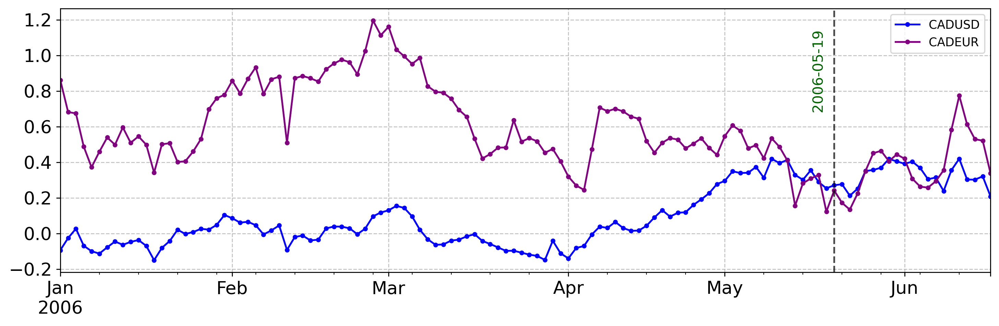

In [127]:
frame = data.head(120).loc[:, ['CADUSD', 'CADEUR']]
fig = plt.figure(dpi=250, figsize=(14,4))
ax1 = fig.add_subplot(1,1,1)
vec = frame.CADUSD.values
frame.CADUSD.plot(ax=ax1, linestyle='-', marker='o', markersize=3, color='blue', label='CADUSD')
frame.CADEUR.plot(ax=ax1, linestyle='-', marker='o', markersize=3, color='purple', label='CADEUR')
text(x=pd.to_datetime('2006-05-17'), y=.7, 
     s=frame.index[99].date(), fontsize=12, ha='center',color='darkgreen', rotation='90')
ax1.axvline(x=frame.index[99],color='k',alpha=.7, linestyle='--')
ax1.grid(True, linestyle='--', alpha=.75)
ax1.legend(loc='best')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

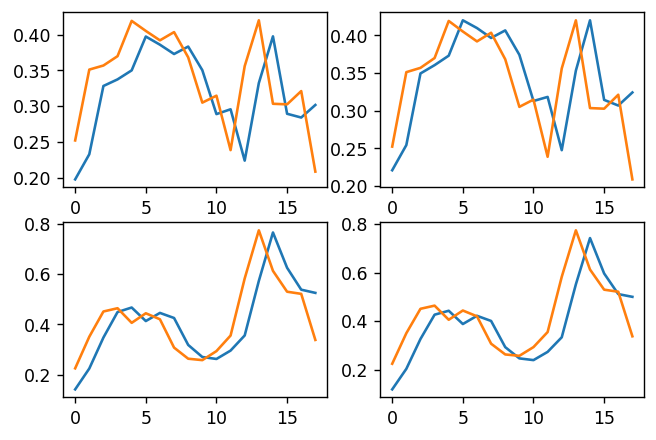

In [128]:
trainsample, testsample = frame.head(100), frame.tail(20)
lag = 3
X1_train, y1_train = reshapeSeries(trainsample.CADUSD.values, lag)
X2_train, y2_train = reshapeSeries(trainsample.CADEUR.values, lag)
X1_test, y1_test = reshapeSeries(testsample.CADUSD.values, lag)
X2_test, y2_test = reshapeSeries(testsample.CADEUR, lag)

bb = patterns['model4']['model'].predict(X1_test)
pp = patterns['model2']['model'].predict(X2_test)
bp = patterns['model4']['model'].predict(X2_test)
pb = patterns['model2']['model'].predict(X1_test)

respfr = pd.DataFrame(
    {
        'CADUSD - CADUSD':bb,
        'CADEUR - CADEUR':pp,
        'CADUSD - CADEUR':bp,
        'CADEUR - CADUSD':pb
    }
                     )
fig = plt.figure(dpi=125, figsize=(6,4))
ax1, ax2, ax3, ax4 = fig.add_subplot(2,2,1), fig.add_subplot(2,2,2),fig.add_subplot(2,2,3),fig.add_subplot(2,2,4)

ax1.plot(respfr['CADUSD - CADUSD'])
ax1.plot(y1_test)
ax2.plot(respfr['CADEUR - CADUSD'])
ax2.plot(y1_test)
ax3.plot(respfr['CADEUR - CADEUR'])
ax3.plot(y2_test)
ax4.plot(respfr['CADUSD - CADEUR'])
ax4.plot(y2_test)

<AxesSubplot:>

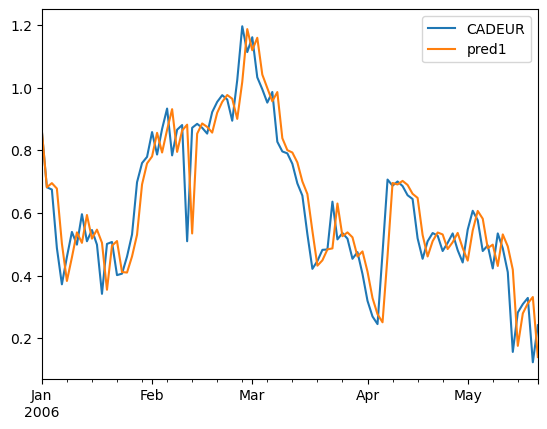

In [109]:
pred1 = patterns['model2']['model'].predict(X2_train)
testfr = trainsample.copy()
vec = list(testfr.CADEUR.values.flatten()[0:2])
vec.extend(pred1)
testfr['pred1'] = vec
testfr.loc[:, ['CADEUR', 'pred1']].plot()

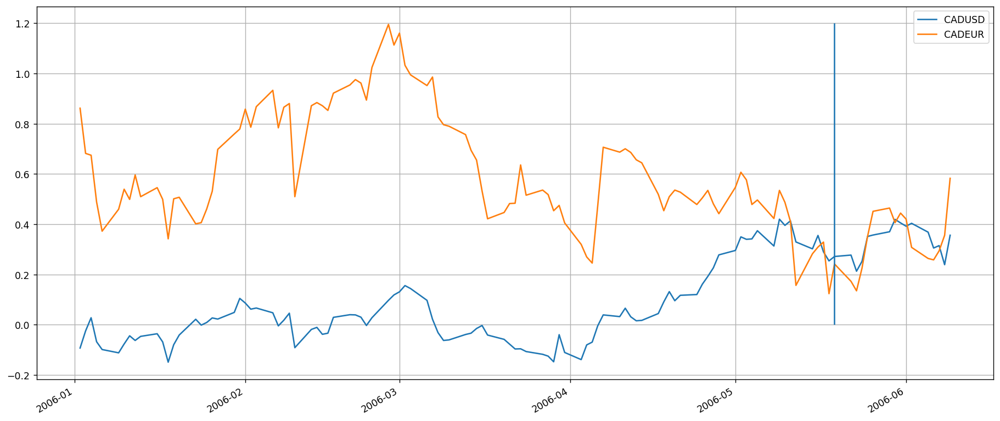

In [33]:


fig = plt.figure(dpi=125, figsize=(18,8))
ax1 = fig.add_subplot(111)
frame.plot(ax=ax1)
ax1.vlines(x=frame.index[99], ymin=0, ymax=1.2)
ax1.grid(True)
plt.show()

In [34]:
frame.head(100)

,CADUSD,CADEUR
2006-01-02,-0.093135,0.861838
2006-01-03,-0.025008,0.681954
2006-01-04,0.027555,0.674636
2006-01-05,-0.068079,0.488142
2006-01-06,-0.099007,0.372233
...,...,...
2006-05-15,0.301876,0.282291
2006-05-16,0.355257,0.308967
2006-05-17,0.289842,0.328797
2006-05-18,0.253899,0.123418


In [35]:
frame.index[99]

Timestamp('2006-05-19 00:00:00')

In [14]:
patterns

{'model1': {'model': LinearRegression(),
  'representative_sequence_name': 'NZDUSD',
  'representative_sequence_value': array([-0.54410252, -0.54088318, -0.42999636, -0.47989612, -0.41081909,
         -0.3789171 , -0.35953168, -0.32459074, -0.36889829, -0.31378097,
         -0.34679308, -0.4220729 , -0.47205592, -0.54797405, -0.58260971,
         -0.51503133, -0.52280215, -0.46485403, -0.50073857, -0.50918934,
         -0.53572113, -0.47596908, -0.48707025, -0.42999636, -0.46223138,
         -0.54668354, -0.58260971, -0.62015942, -0.54282588, -0.57300719,
         -0.63155199, -0.64229238, -0.59919208, -0.71926512, -0.73414069,
         -0.70185016, -0.81325041, -0.86284489, -0.81873161, -0.79802793,
         -0.8435566 , -0.79863849, -0.79375398, -0.73414069, -0.76065861,
         -0.88804455, -0.99739108, -0.96457324, -1.03229039, -1.1058634 ,
         -1.15573541, -1.0852846 , -1.03809075, -1.15461141, -1.18774841,
         -1.3362682 , -1.32923283, -1.28074847, -1.3362682 , -1.5375

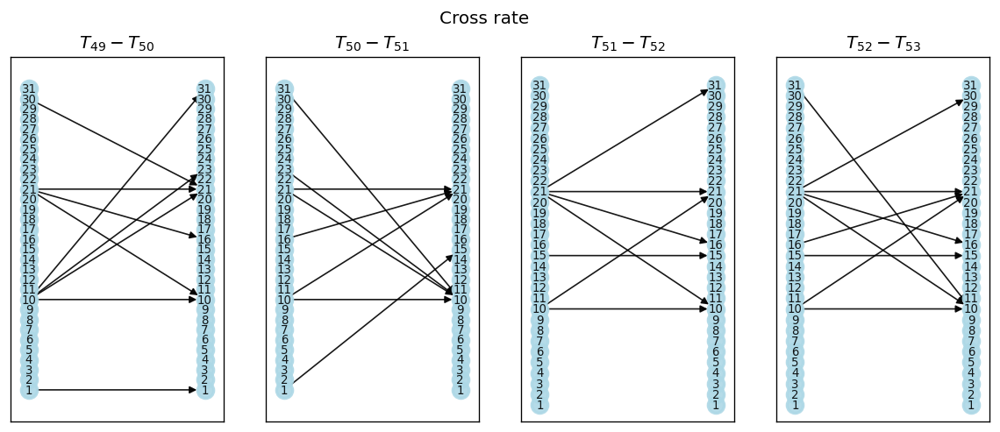

In [18]:
view_causal_relations(patterns, evolving_graphs)

In [253]:
list(data)

['JPYUSD',
 'GBPUSD',
 'EURUSD',
 'CADCNY',
 'CADUSD',
 'CADEUR',
 'AUDJPY',
 'NZDUSD',
 'EURJPY',
 'GBPJPY',
 'EURGBP',
 'EURSEK',
 'EURCHF',
 'EURHUF',
 'CHFUSD',
 'USDHKD',
 'USDSGD',
 'USDINR',
 'USDMXN',
 'USDPHP',
 'USDIDR',
 'USDTHB',
 'USDMYR',
 'USDZAR',
 'CNYUSD']

In [311]:
import statsmodels.api as sm
from statsmodels.tsa.ar_model import AutoReg, AutoRegResults
f = data.USDMYR.head(100)
train = f.head(85)
test = pd.DataFrame({'truth':f.tail(15).values.flatten()})
X_train, y_train = reshapeSeries(train, 3)
print(test, X_train, y_train)

       truth
0  -0.051294
1  -0.084283
2  -0.105397
3  -0.119253
4  -0.116174
5  -0.138167
6  -0.172036
7  -0.162359
8  -0.178414
9  -0.202607
10 -0.082964
11 -0.146744
12 -0.197548
13 -0.158400
14 -0.102318 [[ 0.26276871  0.22472053]
 [ 0.22472053  0.23021882]
 [ 0.23021882  0.22757964]
 [ 0.22757964  0.19766894]
 [ 0.19766894  0.19590948]
 [ 0.19590948  0.19590948]
 [ 0.19590948  0.1849129 ]
 [ 0.1849129   0.17831495]
 [ 0.17831495  0.14664479]
 [ 0.14664479  0.18601256]
 [ 0.18601256  0.17127714]
 [ 0.17127714  0.2113047 ]
 [ 0.2113047   0.19261051]
 [ 0.19261051  0.16182008]
 [ 0.16182008  0.19920846]
 [ 0.19920846  0.19151085]
 [ 0.19151085  0.18601256]
 [ 0.18601256  0.18711222]
 [ 0.18711222  0.22054183]
 [ 0.22054183  0.19854866]
 [ 0.19854866  0.20206757]
 [ 0.20206757  0.21306415]
 [ 0.21306415  0.21306415]
 [ 0.21306415  0.17941461]
 [ 0.17941461  0.17677543]
 [ 0.17677543  0.16072042]
 [ 0.16072042  0.14202623]
 [ 0.14202623  0.15192315]
 [ 0.15192315  0.14796438]
 [ 0.1479

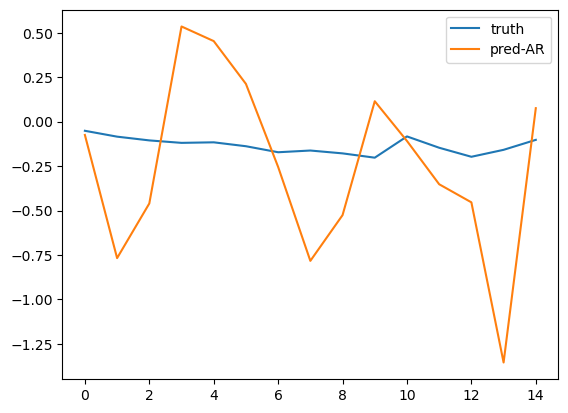

In [308]:
res = AutoReg(train, lags = 25, trend='c').fit()
res2 = 
# res2 = sm.tsa.arima.ARIMA(train, order=(3,0,3)).fit()
test['pred-AR']  = res.forecast(steps=15).values
test.plot()
plt.show()

In [167]:
outputs = AutoRegResults(res.model, res.params, res.cov_params)

In [255]:
steps_index = {}
for k,dic in patterns.items():
    for j, step in enumerate(dic['steps']):
        if step not in steps_index:
            steps_index[step] = dic['time_intervals'][j]

In [ ]:
data.loc[steps_i]

In [71]:
step_ahead = 1
size = 400
# size = int(path_to_data.split('/')[-1].split('.')[0].split('_'))
percentage = .35
prediction_length = size*step_ahead
models = {}
indexes = []
j = 1
for step in range(j, int(nbre_steps*percentage)+1):
    indexes.extend(steps_index[step])
fr = data.loc[indexes, :].drop_duplicates()

X = fr.values.T
# print(X)
clusters = FINCH(X)[0]
# print(clusters)
classes = {}
for i, index in enumerate(clusters[:, -1]):
    if index in classes:
        classes[index].append(list(fr)[i])
    else:
        classes[index] = [list(fr)[i]]
        
print('Training models ...')
# Training step
for m in tqdm(range(len(classes))):
# for s in tqdm(list(data)):
    s = classes[m][0]
    target = fr.tail(prediction_length)[s].T.values.flatten()
    feat = fr.head(len(fr)-prediction_length).values.T
    train_ds = ListDataset(
        [
            {
                FieldName.TARGET: target,
                FieldName.START: fr.index[0], #[pd.Period("01-01-2020", freq="1D") for _ in range(30)],
                FieldName.FEAT_DYNAMIC_REAL: feat,
            }
        ],
        freq='1D',
    )
#     estimator = PatchTSTEstimator(
#            prediction_length=prediction_length,
#             num_batches_per_epoch=10,
#             batch_size=64,
#             context_length=len(fr)-prediction_length,
#             patch_len=15,
#             stride=15,
#         )
#     estimator = DLinearEstimator(
#             prediction_length=prediction_length,
#             num_batches_per_epoch=10,
#             batch_size=64,
#             context_length=len(fr)-prediction_length,
#             )
    estimator = TemporalFusionTransformerEstimator(
            prediction_length = prediction_length*step_ahead,
            context_length = len(fr)-prediction_length,
            batch_size = 5,
            num_batches_per_epoch = 1,
            freq='1D'
        )
    predictor = estimator.train(training_data=train_ds)
    for ser in classes[m]:
        models[ser] = predictor

Partition 0: 18 clusters
Partition 1: 5 clusters
Training models ...



  0%|                                                     | 0/5 [00:00<?, ?it/s]GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type                           | Params | In sizes | Out sizes  
----------------------------------------------------------------------------------
0 | model | TemporalFusionTransformerModel | 109 K  | ?        | [1, 9, 400]
----------------------------------------------------------------------------------
109 K     Trainable params
0         Non-trainable params
109 K     Total params
0.439     Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'train_loss' reached 0.73945 (best 0.73945), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=0-step=1.ckpt' as top 1
Epoch 1, global step 2: 'train_loss' reached 0.73519 (best 0.73519), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=1-step=2.ckpt' as top 1
Epoch 2, global step 3: 'train_loss' reached 0.73303 (best 0.73303), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=2-step=3.ckpt' as top 1
Epoch 3, global step 4: 'train_loss' reached 0.73161 (best 0.73161), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=3-step=4.ckpt' as top 1
Epoch 4, global step 5: 'train_loss' reached 0.72969 (best 0.72969), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=4-step=5.ckpt' as top 1
Epoch 5, global step 6: 'train_loss' reached 0.72752 (best 0.72752), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=5-step=6.ckpt' a

Epoch 48, global step 49: 'train_loss' reached 0.68335 (best 0.68335), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=48-step=49.ckpt' as top 1
Epoch 49, global step 50: 'train_loss' reached 0.68250 (best 0.68250), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=49-step=50.ckpt' as top 1
Epoch 50, global step 51: 'train_loss' reached 0.68164 (best 0.68164), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=50-step=51.ckpt' as top 1
Epoch 51, global step 52: 'train_loss' reached 0.68076 (best 0.68076), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=51-step=52.ckpt' as top 1
Epoch 52, global step 53: 'train_loss' reached 0.67987 (best 0.67987), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=52-step=53.ckpt' as top 1
Epoch 53, global step 54: 'train_loss' reached 0.67896 (best 0.67896), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/

Epoch 96, global step 97: 'train_loss' reached 0.61164 (best 0.61164), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=96-step=97.ckpt' as top 1
Epoch 97, global step 98: 'train_loss' reached 0.61027 (best 0.61027), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=97-step=98.ckpt' as top 1
Epoch 98, global step 99: 'train_loss' reached 0.60832 (best 0.60832), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=98-step=99.ckpt' as top 1
Epoch 99, global step 100: 'train_loss' reached 0.60699 (best 0.60699), saving model to '/home/etienne/lightning_logs/version_69/checkpoints/epoch=99-step=100.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=100` reached.

 20%|█████████                                    | 1/5 [00:30<02:00, 30.03s/it]GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type                

Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'train_loss' reached 5.30628 (best 5.30628), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=0-step=1.ckpt' as top 1
Epoch 1, global step 2: 'train_loss' reached 5.30335 (best 5.30335), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=1-step=2.ckpt' as top 1
Epoch 2, global step 3: 'train_loss' reached 5.30077 (best 5.30077), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=2-step=3.ckpt' as top 1
Epoch 3, global step 4: 'train_loss' reached 5.29860 (best 5.29860), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=3-step=4.ckpt' as top 1
Epoch 4, global step 5: 'train_loss' reached 5.29645 (best 5.29645), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=4-step=5.ckpt' as top 1
Epoch 5, global step 6: 'train_loss' reached 5.29428 (best 5.29428), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=5-step=6.ckpt' a

Epoch 48, global step 49: 'train_loss' reached 5.23796 (best 5.23796), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=48-step=49.ckpt' as top 1
Epoch 49, global step 50: 'train_loss' reached 5.23680 (best 5.23680), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=49-step=50.ckpt' as top 1
Epoch 50, global step 51: 'train_loss' reached 5.23562 (best 5.23562), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=50-step=51.ckpt' as top 1
Epoch 51, global step 52: 'train_loss' reached 5.23444 (best 5.23444), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=51-step=52.ckpt' as top 1
Epoch 52, global step 53: 'train_loss' reached 5.23325 (best 5.23325), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=52-step=53.ckpt' as top 1
Epoch 53, global step 54: 'train_loss' reached 5.23204 (best 5.23204), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/

Epoch 96, global step 97: 'train_loss' reached 5.17289 (best 5.17289), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=96-step=97.ckpt' as top 1
Epoch 97, global step 98: 'train_loss' reached 5.17134 (best 5.17134), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=97-step=98.ckpt' as top 1
Epoch 98, global step 99: 'train_loss' reached 5.16979 (best 5.16979), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=98-step=99.ckpt' as top 1
Epoch 99, global step 100: 'train_loss' reached 5.16822 (best 5.16822), saving model to '/home/etienne/lightning_logs/version_70/checkpoints/epoch=99-step=100.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=100` reached.

 40%|██████████████████                           | 2/5 [01:03<01:35, 31.81s/it]GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type                

Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'train_loss' reached 3.28302 (best 3.28302), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=0-step=1.ckpt' as top 1
Epoch 1, global step 2: 'train_loss' reached 3.28006 (best 3.28006), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=1-step=2.ckpt' as top 1
Epoch 2, global step 3: 'train_loss' reached 3.27733 (best 3.27733), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=2-step=3.ckpt' as top 1
Epoch 3, global step 4: 'train_loss' reached 3.27475 (best 3.27475), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=3-step=4.ckpt' as top 1
Epoch 4, global step 5: 'train_loss' reached 3.27262 (best 3.27262), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=4-step=5.ckpt' as top 1
Epoch 5, global step 6: 'train_loss' reached 3.27097 (best 3.27097), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=5-step=6.ckpt' a

Epoch 48, global step 49: 'train_loss' reached 3.21868 (best 3.21868), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=48-step=49.ckpt' as top 1
Epoch 49, global step 50: 'train_loss' reached 3.21751 (best 3.21751), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=49-step=50.ckpt' as top 1
Epoch 50, global step 51: 'train_loss' reached 3.21634 (best 3.21634), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=50-step=51.ckpt' as top 1
Epoch 51, global step 52: 'train_loss' reached 3.21516 (best 3.21516), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=51-step=52.ckpt' as top 1
Epoch 52, global step 53: 'train_loss' reached 3.21397 (best 3.21397), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=52-step=53.ckpt' as top 1
Epoch 53, global step 54: 'train_loss' reached 3.21277 (best 3.21277), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/

Epoch 96, global step 97: 'train_loss' reached 3.15365 (best 3.15365), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=96-step=97.ckpt' as top 1
Epoch 97, global step 98: 'train_loss' reached 3.15209 (best 3.15209), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=97-step=98.ckpt' as top 1
Epoch 98, global step 99: 'train_loss' reached 3.15053 (best 3.15053), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=98-step=99.ckpt' as top 1
Epoch 99, global step 100: 'train_loss' reached 3.14897 (best 3.14897), saving model to '/home/etienne/lightning_logs/version_71/checkpoints/epoch=99-step=100.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=100` reached.

 60%|███████████████████████████                  | 3/5 [01:34<01:03, 31.83s/it]GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type                

Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'train_loss' reached 7.92540 (best 7.92540), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=0-step=1.ckpt' as top 1
Epoch 1, global step 2: 'train_loss' reached 7.92150 (best 7.92150), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=1-step=2.ckpt' as top 1
Epoch 2, global step 3: 'train_loss' reached 7.91844 (best 7.91844), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=2-step=3.ckpt' as top 1
Epoch 3, global step 4: 'train_loss' reached 7.91586 (best 7.91586), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=3-step=4.ckpt' as top 1
Epoch 4, global step 5: 'train_loss' reached 7.91340 (best 7.91340), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=4-step=5.ckpt' as top 1
Epoch 5, global step 6: 'train_loss' reached 7.91092 (best 7.91092), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=5-step=6.ckpt' a

Epoch 48, global step 49: 'train_loss' reached 7.84773 (best 7.84773), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=48-step=49.ckpt' as top 1
Epoch 49, global step 50: 'train_loss' reached 7.84661 (best 7.84661), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=49-step=50.ckpt' as top 1
Epoch 50, global step 51: 'train_loss' reached 7.84549 (best 7.84549), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=50-step=51.ckpt' as top 1
Epoch 51, global step 52: 'train_loss' reached 7.84436 (best 7.84436), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=51-step=52.ckpt' as top 1
Epoch 52, global step 53: 'train_loss' reached 7.84322 (best 7.84322), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=52-step=53.ckpt' as top 1
Epoch 53, global step 54: 'train_loss' reached 7.84208 (best 7.84208), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/

Epoch 96, global step 97: 'train_loss' reached 7.78593 (best 7.78593), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=96-step=97.ckpt' as top 1
Epoch 97, global step 98: 'train_loss' reached 7.78444 (best 7.78444), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=97-step=98.ckpt' as top 1
Epoch 98, global step 99: 'train_loss' reached 7.78295 (best 7.78295), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=98-step=99.ckpt' as top 1
Epoch 99, global step 100: 'train_loss' reached 7.78144 (best 7.78144), saving model to '/home/etienne/lightning_logs/version_72/checkpoints/epoch=99-step=100.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=100` reached.

 80%|████████████████████████████████████         | 4/5 [02:09<00:32, 32.97s/it]GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type                

Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'train_loss' reached 9.24656 (best 9.24656), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=0-step=1.ckpt' as top 1
Epoch 1, global step 2: 'train_loss' reached 9.24242 (best 9.24242), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=1-step=2.ckpt' as top 1
Epoch 2, global step 3: 'train_loss' reached 9.23959 (best 9.23959), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=2-step=3.ckpt' as top 1
Epoch 3, global step 4: 'train_loss' reached 9.23710 (best 9.23710), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=3-step=4.ckpt' as top 1
Epoch 4, global step 5: 'train_loss' reached 9.23475 (best 9.23475), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=4-step=5.ckpt' as top 1
Epoch 5, global step 6: 'train_loss' reached 9.23244 (best 9.23244), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=5-step=6.ckpt' a

Epoch 48, global step 49: 'train_loss' reached 9.17583 (best 9.17583), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=48-step=49.ckpt' as top 1
Epoch 49, global step 50: 'train_loss' reached 9.17472 (best 9.17472), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=49-step=50.ckpt' as top 1
Epoch 50, global step 51: 'train_loss' reached 9.17360 (best 9.17360), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=50-step=51.ckpt' as top 1
Epoch 51, global step 52: 'train_loss' reached 9.17248 (best 9.17248), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=51-step=52.ckpt' as top 1
Epoch 52, global step 53: 'train_loss' reached 9.17134 (best 9.17134), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=52-step=53.ckpt' as top 1
Epoch 53, global step 54: 'train_loss' reached 9.17020 (best 9.17020), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/

Epoch 96, global step 97: 'train_loss' reached 9.11293 (best 9.11293), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=96-step=97.ckpt' as top 1
Epoch 97, global step 98: 'train_loss' reached 9.11140 (best 9.11140), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=97-step=98.ckpt' as top 1
Epoch 98, global step 99: 'train_loss' reached 9.10985 (best 9.10985), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=98-step=99.ckpt' as top 1
Epoch 99, global step 100: 'train_loss' reached 9.10830 (best 9.10830), saving model to '/home/etienne/lightning_logs/version_73/checkpoints/epoch=99-step=100.ckpt' as top 1
`Trainer.fit` stopped: `max_epochs=100` reached.

100%|█████████████████████████████████████████████| 5/5 [02:40<00:00, 32.08s/it]


In [72]:
print('Testing models ...')
# Testing step
results = {'series':[], 'MAE':[], 'MAPE':[], 'MSE':[]}

for step in tqdm(range(int(nbre_steps*percentage)+1, int(nbre_steps*percentage)+5)):
    indexes = []
    for k in range(step, int(nbre_steps*percentage)+step):
        indexes.extend(steps_index[k])
    fr = data.loc[indexes, :].drop_duplicates()
    print(len(fr))
    for s in models:
        test_ds = ListDataset(
            [
                {
                    FieldName.TARGET: fr.tail(prediction_length)[s].T.values.flatten(),
                    FieldName.START: fr.index[0], #[pd.Period("01-01-2020", freq="1D") for _ in range(30)],
                    FieldName.FEAT_DYNAMIC_REAL: fr.head(len(fr)-prediction_length).values.T,
                }
            ],
            freq='1D',
        )
        
        forecast_it, ts_it = make_evaluation_predictions(
            dataset=test_ds,  # test dataset
            predictor=models[s],  # predictor
            num_samples=10,  # number of sample paths we want for evaluation
        )
        forecasts = list(forecast_it)
        tss = list(ts_it)
        evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
        agg_metrics, item_metrics = evaluator(tss, forecasts)
        
        results['series'].append(s)
        mae = agg_metrics['abs_error']/prediction_length
        mse = agg_metrics["MSE"]
        mape = agg_metrics["MAPE"]
        results['MAE'].append(mae)
        results['MSE'].append(mse)
        results['MAPE'].append(mape)
results = pd.DataFrame(results)
results.loc[:, ['MAE', 'MSE', 'MAPE']].mean(axis=0)

Testing models ...



  0%|                                                     | 0/4 [00:00<?, ?it/s]

1045




Running evaluation: 1it [00:00,  2.69it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.84it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.78it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.91it/s][AThe




Running evaluation: 1it [00:00,  2.80it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.83it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.85it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.93it/s][ATh




Running evaluation: 1it [00:00,  2.78it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.98it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.72it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.91it/s][ATh

1045




Running evaluation: 1it [00:00,  2.78it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.92it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.81it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.87it/s][AThe




Running evaluation: 1it [00:00,  2.83it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.93it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.91it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.83it/s][ATh




Running evaluation: 1it [00:00,  2.94it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.93it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.90it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.98it/s][ATh

1045




Running evaluation: 1it [00:00,  2.89it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.95it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.90it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.92it/s][AThe




Running evaluation: 1it [00:00,  2.96it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.88it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.91it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.91it/s][ATh




Running evaluation: 1it [00:00,  2.55it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.67it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.63it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.67it/s][ATh

1045




Running evaluation: 1it [00:00,  2.74it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.62it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.71it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.76it/s][AThe




Running evaluation: 1it [00:00,  2.89it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.62it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.59it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.70it/s][ATh




Running evaluation: 1it [00:00,  2.93it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.93it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.90it/s][AThe mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.
The mean prediction is not stored in the forecast data; the median is being returned instead. This behaviour may change in the future.



Running evaluation: 1it [00:00,  2.79it/s][ATh

MAE     0.599192
MSE     0.525504
MAPE    2.068892
dtype: float64

In [54]:
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_ds,  # test dataset
    predictor=predictor,  # predictor
#     num_samples=10,  # number of sample paths we want for evaluation
)

forecasts = list(forecast_it)
tss = list(ts_it)

evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
agg_metrics, item_metrics = evaluator(tss, forecasts)

Running evaluation: 1it [00:00,  4.85it/s]


In [58]:
print(agg_metrics['abs_error']/(1*30*1), agg_metrics["MSE"], agg_metrics["MAPE"])

0.40983864466349285 0.16809178988138834 0.9998803456624349


In [48]:
for k, val in next(iter(train_ds)).items():
    if k == 'feat_dynamic_real':
        print(val.shape)

(70, 150)


In [71]:
from gluonts.dataset.common import ListDataset
from gluonts.evaluation.backtest import make_evaluation_predictions
from gluonts.torch.model.patch_tst import PatchTSTEstimator
from gluonts.torch.model.d_linear import DLinearEstimator
from gluonts.torch.model.tft import TemporalFusionTransformerEstimator

def create_dataset(data, start, horizion, freq, OT):
    # number of step-ahead = horizion
    train = ListDataset(
        [
            {"target": x, "start": start} for x in data[OT, :-horizion]
        ],
        freq=freq
    )
 
    test = ListDataset(
        [
            {"target": x, "start": start} for x in data[OT,:]
        ],
        freq=freq
    )
    return train, test


fr = data.head(int(len(data)*.5)).T.values

ahead = 4
train, test = create_dataset(data=fr, start=pd.Period(data.index[0], "1D"), freq="1D", horizion=100*ahead)

# estimator = DLinearEstimator(
#             prediction_length=50*ahead,
#             num_batches_per_epoch=50,
#             batch_size=64,
#             context_length=fr.shape[1]-15*ahead,
#             )
estimator = PatchTSTEstimator(
           prediction_length=100*ahead,
            num_batches_per_epoch=50,
            batch_size=64,
            context_length=fr.shape[1]-100*ahead,
            patch_len=15,
            stride=15,
        )

predictor = estimator.train(training_data=train)

forecast_it, ts_it = make_evaluation_predictions(
    dataset=test,  # test dataset
    predictor=predictor,  # predictor
    num_samples=10,  # number of sample paths we want for evaluation
)

forecasts = list(forecast_it)
tss = list(ts_it)

evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
agg_metrics, item_metrics = evaluator(tss, forecasts)


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name  | Type          | Params
----------------------------------------
0 | model | PatchTSTModel | 28.3 M
----------------------------------------
28.3 M    Trainable params
2.2 K     Non-trainable params
28.3 M    Total params
113.214   Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

Epoch 0, global step 50: 'train_loss' reached 1.42200 (best 1.42200), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=0-step=50.ckpt' as top 1
Epoch 1, global step 100: 'train_loss' reached 0.60780 (best 0.60780), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=1-step=100.ckpt' as top 1
Epoch 2, global step 150: 'train_loss' reached 0.46643 (best 0.46643), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=2-step=150.ckpt' as top 1
Epoch 3, global step 200: 'train_loss' reached 0.36411 (best 0.36411), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=3-step=200.ckpt' as top 1
Epoch 4, global step 250: 'train_loss' reached 0.32337 (best 0.32337), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=4-step=250.ckpt' as top 1
Epoch 5, global step 300: 'train_loss' reached 0.30297 (best 0.30297), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/ep

Epoch 69, global step 3500: 'train_loss' reached -0.34004 (best -0.34004), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=69-step=3500.ckpt' as top 1
Epoch 70, global step 3550: 'train_loss' was not in top 1
Epoch 71, global step 3600: 'train_loss' was not in top 1
Epoch 72, global step 3650: 'train_loss' was not in top 1
Epoch 73, global step 3700: 'train_loss' was not in top 1
Epoch 74, global step 3750: 'train_loss' was not in top 1
Epoch 75, global step 3800: 'train_loss' was not in top 1
Epoch 76, global step 3850: 'train_loss' was not in top 1
Epoch 77, global step 3900: 'train_loss' was not in top 1
Epoch 78, global step 3950: 'train_loss' was not in top 1
Epoch 79, global step 4000: 'train_loss' reached -0.34132 (best -0.34132), saving model to '/home/etienne/lightning_logs/version_28/checkpoints/epoch=79-step=4000.ckpt' as top 1
Epoch 80, global step 4050: 'train_loss' reached -0.34510 (best -0.34510), saving model to '/home/etienne/lightning_logs/v

In [73]:
print(agg_metrics['abs_error']/(100*ahead*data.shape[1]), agg_metrics["MSE"], agg_metrics["MAPE"])

0.44607418850490027 0.384895404270717 2.5752424458095007


In [182]:
mat = evolving_graphs['1-2']['dgl_graph'].ndata['features'].detach().numpy()
mat1,mat2 = mat[0:len(patterns),:], mat[len(patterns):,:]
mat3 = mat1+mat2
print(mat.sum(), mat1.sum(), mat2.sum())

152.0 76.0 76.0


In [183]:
evolving_graphs.keys()

dict_keys(['1-2', '2-3', '3-4', '4-5', '5-6', '6-7', '7-8', '8-9', '9-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-24', '24-25', '25-26', '26-27', '27-28', '28-29', '29-30', '30-31', '31-32', '32-33', '33-34', '34-35', '35-36', '36-37', '37-38', '38-39', '39-40', '40-41', '41-42', '42-43', '43-44', '44-45', '45-46', '46-47', '47-48', '48-49', '49-50', '50-51', '51-52', '52-53'])

In [73]:
listpatterns = list(patterns.keys())
# serial = getSerialization(evolving_graphs, data, listpatterns)
q = 7
serial = getTextReview2(evolving_graphs, data, listpatterns, k=q)

In [74]:
serializedData = pd.DataFrame(serial).sort_values(by='targetTime')

In [75]:
serializedData

,targetSeries,timeInterval,switchPattern,eventUnderwent,finalEvent,targetTime
0,0,T1 to T9,1,\n From T1 to T2 series 0 that was presenting ...,model3,9
2784,16,T1 to T9,1,\n From T1 to T2 series 16 that was presenting...,model18,9
8352,48,T1 to T9,1,\n From T1 to T2 series 48 that was presenting...,model11,9
2610,15,T1 to T9,1,\n From T1 to T2 series 15 that was presenting...,model2,9
10440,10.1,T1 to T9,1,\n From T1 to T2 series 10.1 that was presenti...,model9,9
...,...,...,...,...,...,...
8351,47,T174 to T182,1,\n From T174 to T175 series 47 presented the s...,model3,182
8525,48,T174 to T182,1,\n From T174 to T175 series 48 that was presen...,model5,182
8699,49,T174 to T182,1,\n From T174 to T175 series 49 presented the s...,model91,182
7655,43,T174 to T182,1,\n From T174 to T175 series 43 that was presen...,model58,182


In [76]:
steps_index = {}
for k,dic in patterns.items():
    for j, step in enumerate(dic['steps']):
        if step not in steps_index:
            steps_index[step] = dic['time_intervals'][j]

One time interval ahead
---


Training models ...



  0%|                                                     | 0/3 [00:00<?, ?it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.67it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.22s/it]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.41it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.42it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.27it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]


  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████

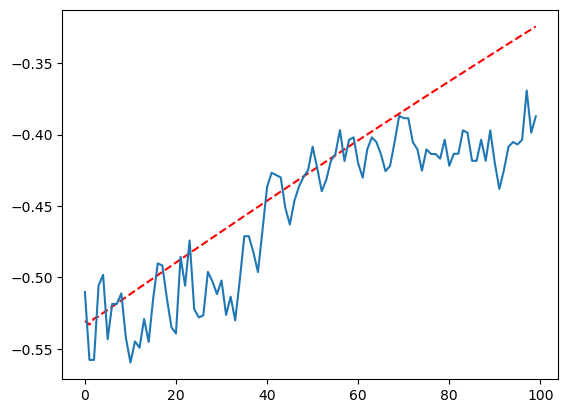

  0%|                                                     | 0/3 [02:57<?, ?it/s]


TypeError: cannot unpack non-iterable NoneType object

In [168]:
# Zero shot setting
examples = None
labels = list(patterns.keys())

# Training the model 
print('Training models ...')
gpt3, gpt4, davinci = getZeroShotModel(labels)
results = {}
results['gpt3'] = {}
results['gpt4'] = {}
results['davinci'] = {}
results['gpt3']['MAE'],results['gpt3']['MSE'],results['gpt3']['MAPE'] = [], [], []
results['gpt4']['MAE'],results['gpt4']['MSE'],results['gpt4']['MAPE'] = [], [], []
results['davinci']['MAE'],results['davinci']['MSE'],results['davinci']['MAPE'] = [], [], []
for t in tqdm(range(q+2, q+5)):
    testsample = serializedData[serializedData.targetTime==t]
    prediction = {}
    prediction['GPT3'] = []
    prediction['GPT4'] = []
    prediction['DAVINCI'] = []
    prediction['true'] = testsample.finalEvent
    for i_, val in enumerate(testsample.eventUnderwent):
        pred1 = gpt3.predict([val])
        pred2 = gpt4.predict([val])
        pred3 = davinci.predict([val])
        prediction['GPT3'].append(pred1[0][0])
        prediction['GPT4'].append(pred2[0][0])
        prediction['DAVINCI'].append(pred3[0][0])
    
    prediction = pd.DataFrame(prediction)
    prediction['series'] = testsample.targetSeries
    previous = data.loc[steps_index[t-1],:]
    current = data.loc[steps_index[t],:]
    out3, out4, out5 = getllmRegression2(prediction, patterns, previous.iloc[0:15,:], current)
    
    for k in ['MAE', 'MSE', 'MAPE']:
        results['gpt3'][k].append(np.array(out3[k]).mean())
        results['gpt4'][k].append(np.array(out4[k]).mean())
        results['davinci'][k].append(np.array(out5[k]).mean())
        
    # break
        

In [81]:
prediction

,GPT3,GPT4,DAVINCI,true,series
5918,model11,model5,model5,model11,34
8006,model5,model5,model5,model11,46
2960,model15,model15,model15,model27,17
11486,model7,model7,model7,model14,16.1
4004,model7,model7,model7,model7,23
...,...,...,...,...,...
8528,model5,model5,model5,model5,49
524,model11,model11,model11,model20,3
4178,model14,model14,model14,model14,24
8876,model14,model14,model14,model14,1.1


In [101]:
current['34']

1970-01-01 00:00:00.000000151    0.050585
1970-01-01 00:00:00.000000152    0.065763
1970-01-01 00:00:00.000000153    0.068473
1970-01-01 00:00:00.000000154    0.079356
1970-01-01 00:00:00.000000155    0.067097
                                   ...   
1970-01-01 00:00:00.000000246    0.147112
1970-01-01 00:00:00.000000247    0.159829
1970-01-01 00:00:00.000000248    0.138981
1970-01-01 00:00:00.000000249    0.120927
1970-01-01 00:00:00.000000250    0.116799
Name: 34, Length: 100, dtype: float64

In [152]:
previous['34']

1970-01-01 00:00:00.000000136    0.053713
1970-01-01 00:00:00.000000137    0.051378
1970-01-01 00:00:00.000000138    0.055589
1970-01-01 00:00:00.000000139    0.052795
1970-01-01 00:00:00.000000140    0.059300
                                   ...   
1970-01-01 00:00:00.000000231    0.118342
1970-01-01 00:00:00.000000232    0.116048
1970-01-01 00:00:00.000000233    0.106000
1970-01-01 00:00:00.000000234    0.099662
1970-01-01 00:00:00.000000235    0.097494
Name: 34, Length: 100, dtype: float64

In [125]:
seriestest = previous['34'].values.flatten()
# seriestest = data['34'].values.flatten()
seriestest

array([0.05371262, 0.05137763, 0.05558895, 0.0527953 , 0.05929991,
       0.0462907 , 0.05046032, 0.05888295, 0.052837  , 0.04174581,
       0.04912604, 0.05792393, 0.05287869, 0.06301087, 0.06997413,
       0.0505854 , 0.06576282, 0.06847307, 0.07935577, 0.06709709,
       0.07164198, 0.07531124, 0.08306674, 0.06626317, 0.06626317,
       0.06626317, 0.05813241, 0.06234373, 0.06434515, 0.06063419,
       0.07305965, 0.06659674, 0.06876494, 0.06930699, 0.06505398,
       0.07126671, 0.07506107, 0.05863277, 0.05950839, 0.05879955,
       0.05854938, 0.05654796, 0.05225325, 0.06030062, 0.06230203,
       0.06259391, 0.05642287, 0.05842429, 0.05854938, 0.05867446,
       0.08077344, 0.06638826, 0.06230203, 0.06638826, 0.06259391,
       0.06422006, 0.07297626, 0.07068297, 0.07460241, 0.062719  ,
       0.06109284, 0.0834837 , 0.08598547, 0.07151689, 0.05842429,
       0.06526246, 0.06601299, 0.07727096, 0.07126671, 0.07989782,
       0.08410914, 0.08185755, 0.08210772, 0.09053035, 0.08415

In [128]:
X_test, y_test = reshapeSeries(seriestest, 3)
X_test.shape

(98, 2)

In [129]:
patterns['model11']['model'].predict(X_test)

array([0.05458499, 0.05574221, 0.05612792, 0.05826746, 0.05438577,
       0.05089731, 0.05704119, 0.05757639, 0.04924539, 0.04824127,
       0.05596928, 0.05718241, 0.06021469, 0.06819007, 0.0612217 ,
       0.06063842, 0.06860922, 0.07538779, 0.07378925, 0.07081919,
       0.07467772, 0.08026127, 0.07496743, 0.06768791, 0.06768791,
       0.06350067, 0.0621471 , 0.0650022 , 0.06395814, 0.06874946,
       0.07080401, 0.0691208 , 0.07033924, 0.06838381, 0.06974083,
       0.07438631, 0.06756971, 0.06090369, 0.06091798, 0.06048207,
       0.05934298, 0.05626423, 0.05854799, 0.06306492, 0.06408227,
       0.06103071, 0.05938804, 0.0603195 , 0.06043811, 0.07187299,
       0.07403836, 0.06570216, 0.06603631, 0.06585247, 0.06504616,
       0.07025996, 0.07287224, 0.07389722, 0.06947537, 0.06348987,
       0.07431641, 0.08530479, 0.07893746, 0.06592696, 0.06377665,
       0.06712555, 0.0732484 , 0.07503339, 0.07687718, 0.08278506,
       0.08344992, 0.08260333, 0.08704926, 0.08741268, 0.08567

In [139]:
np.zeros(2)

array([0., 0.])

In [169]:

# X_test, y_test = reshapeSeries(seriestest, 3)
# h1 = X_test[0,:].flatten()
# h2 = X_test[0,:].flatten() 
# h3 = X_test[0,:].flatten() 
# pred1 = list(patterns['model5']['model'].predict(X_test))
pred1 = []
h1 = list(X_test[0:-15,:])
# pred2 = []
# pred3 = []
for i in range(15):
    yhat1 = patterns['model11']['model'].predict(np.array(h1[i:-15]))
#     yhat2 = patterns['model5']['model'].predict(h2.reshape(1,-1))
#     yhat3 = patterns['model5']['model'].predict(h3.reshape(1,-1))
    vec = np.zeros(2)
#     print(h1[-1][1])
    vec[0] = h1[-1][1]
    vec[1] = yhat1[0]
    h1.append(vec)
#     h1[0:-1] = h1[1:]
#     h1[-1] = yhat1[0]
    pred1.append(yhat1[-1])
    X_test = np.array(h1)
#     h2[0:-1] = h2[1:]
#     h2[-1] = yhat2[0]
#     pred2.append(yhat2[0])
#     h3[0:-1] = h3[1:]
#     h3[-1] = yhat3[0]
#     pred3.append(yhat3[0])


In [170]:
len(pred1), len(current)

(15, 100)

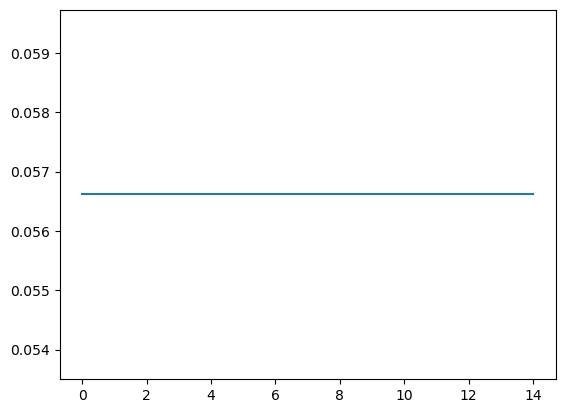

In [171]:
test = patterns['model11']['model'].predict(np.array(h1))
plt.plot(pred1)
# plt.plot(current['34'].values.flatten(), 'k-')

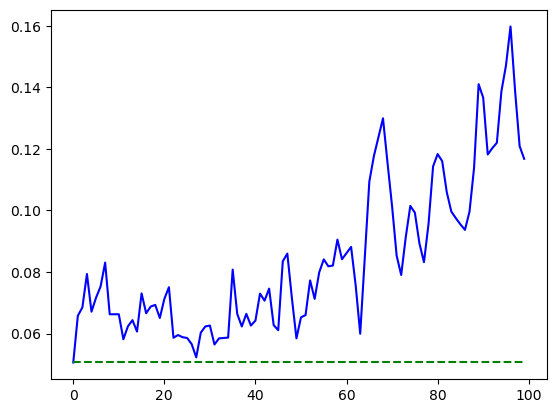

In [155]:
plt.plot(current['34'].values.flatten(), 'b-')
# plt.plot(patterns['model11']['model'].predict(X_test),'r--')
plt.plot(np.array(pred1),'g--')

Four time intervals ahead
---

In [154]:
# # Zero shot setting
# examples = None
# labels = list(patterns.keys())

# # Training the model 
# print('Training models ...')
# gpt3, gpt4, davinci = getZeroShotModel(labels)
# results = {}
# results['gpt3'] = {}
# results['gpt4'] = {}
# results['davinci'] = {}
# results['gpt3']['MAE'],results['gpt3']['MSE'],results['gpt3']['MAPE'] = [], [], []
# results['gpt4']['MAE'],results['gpt4']['MSE'],results['gpt4']['MAPE'] = [], [], []
# results['davinci']['MAE'],results['davinci']['MSE'],results['davinci']['MAPE'] = [], [], []

# for s in tqdm(range(q+2, q+5)):
#     testsamplegpt3 = serializedData[serializedData.targetTime==s].eventUnderwent.values
#     testsamplegpt4 = serializedData[serializedData.targetTime==s].eventUnderwent.values
#     testsampledav = serializedData[serializedData.targetTime==s].eventUnderwent.values
#     listseries = serializedData[serializedData.targetTime==s].targetSeries.values
# #     print(testsamplegpt3[0])
# #     print(testsamplegpt4[0])
# #     print(testsampledav[0])
# #     print('----------------')
#     for t in range(s, s+4):
#         prediction = {}
#         prediction['GPT3'] = []
#         prediction['GPT4'] = []
#         prediction['DAVINCI'] = []
#         prediction['true'] = serializedData[serializedData.targetTime==t].finalEvent
#         for i in range(len(testsamplegpt3)):
#             val1, val2, val3 = testsamplegpt3[i], testsamplegpt4[i], testsampledav[i]
#             pred1 = gpt3.predict([val1])
#             pred2 = gpt4.predict([val2])
#             pred3 = davinci.predict([val3])
#             prediction['GPT3'].append(pred1[0][0])
#             prediction['GPT4'].append(pred2[0][0])
#             prediction['DAVINCI'].append(pred3[0][0])
# #         for i in range(len(testsamplegpt3)):
#             testsamplegpt3[i] = updatePhrase(val1, pred1[0][0], 'T'+str(t), listseries[i])
#             testsamplegpt4[i] = updatePhrase(val2, pred2[0][0], 'T'+str(t), listseries[i])
#             testsampledav[i] = updatePhrase(val3, pred3[0][0], 'T'+str(t), listseries[i])
#         prediction = pd.DataFrame(prediction)
#         prediction['series'] = listseries
#         previous = data.loc[steps_index[t-1],:]
#         current = data.loc[steps_index[t],:]
#         out3, out4, out5 = getllmRegression2(prediction, patterns, previous.iloc[0:15,:], current)

#         for k in ['MAE', 'MSE', 'MAPE']:
#             results['gpt3'][k].append(np.array(out3[k]).mean())
#             results['gpt4'][k].append(np.array(out4[k]).mean())
#             results['davinci'][k].append(np.array(out5[k]).mean())
# #         print(testsamplegpt3[0])
# #         print(testsamplegpt4[0])
# #         print(testsampledav[0])
# #         break
# #     break
        

In [78]:
pt3, pt4, dav = pd.DataFrame(results['gpt3']).dropna(), pd.DataFrame(results['gpt4']).dropna(), pd.DataFrame(results['davinci']).dropna()
print('GPT3 \n -----')
print(pt3.mean())
print('GPT4 \n -----')
print(pt4.mean())
print('DAVINCI \n -----')
print(dav.mean())

GPT3 
 -----
MAE     0.155227
MSE     0.055941
MAPE    1.030566
dtype: float64
GPT4 
 -----
MAE     0.153303
MSE     0.055086
MAPE    1.104832
dtype: float64
DAVINCI 
 -----
MAE     0.153121
MSE     0.055108
MAPE    1.036772
dtype: float64


In [153]:
# # Few shot setting
# lookback = int(nbre_steps*0.2)
# # Few shot setting
# examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
# # print(examples)
# labels = serializedData.finalEvent.values[0:len(list(data))*lookback].reshape(-1,1)

# # Training the model 
# print('Training models ...')
# gpt3, gpt4, davinci = getFewShotModel(examples, labels)


# results = {}
# results['gpt3'] = {}
# results['gpt4'] = {}
# results['davinci'] = {}
# results['gpt3']['MAE'],results['gpt3']['MSE'],results['gpt3']['MAPE'] = [], [], []
# results['gpt4']['MAE'],results['gpt4']['MSE'],results['gpt4']['MAPE'] = [], [], []
# results['davinci']['MAE'],results['davinci']['MSE'],results['davinci']['MAPE'] = [], [], []
# for t in tqdm(range(lookback+2, lookback+5)):
#     testsample = serializedData[serializedData.targetTime==t]
#     prediction = {}
#     prediction['GPT3'] = []
#     prediction['GPT4'] = []
#     prediction['DAVINCI'] = []
#     prediction['true'] = testsample.finalEvent
#     for i_, val in enumerate(testsample.eventUnderwent):
#         pred1 = gpt3.predict([val])
#         pred2 = gpt4.predict([val])
#         pred3 = davinci.predict([val])
#         prediction['GPT3'].append(pred1[0])
#         prediction['GPT4'].append(pred2[0])
#         prediction['DAVINCI'].append(pred3[0])
    
#     prediction = pd.DataFrame(prediction)
#     prediction['series'] = testsample.targetSeries
#     previous = data.loc[steps_index[t-1],:]
#     current = data.loc[steps_index[t],:]
#     out3, out4, out5 = getllmRegression2(prediction, patterns, previous.iloc[0:15,:], current)
    
#     for k in ['MAE', 'MSE', 'MAPE']:
#         results['gpt3'][k].append(np.array(out3[k]).mean())
#         results['gpt4'][k].append(np.array(out4[k]).mean())
#         results['davinci'][k].append(np.array(out5[k]).mean())
        
# #     break
        

In [189]:
lookback = int(nbre_steps*0.2)
# Few shot setting
examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
# print(examples)
labels = serializedData.finalEvent.values[0:len(list(data))*lookback].reshape(-1,1)

# Training the model 
print('Training models ...')
gpt3, gpt4, davinci = getFewShotModel(examples, labels)


results = {}
results['gpt3'] = {}
results['gpt4'] = {}
results['davinci'] = {}
results['gpt3']['MAE'],results['gpt3']['MSE'],results['gpt3']['MAPE'] = [], [], []
results['gpt4']['MAE'],results['gpt4']['MSE'],results['gpt4']['MAPE'] = [], [], []
results['davinci']['MAE'],results['davinci']['MSE'],results['davinci']['MAPE'] = [], [], []

for s in tqdm(range(q+2, q+5)):
    testsamplegpt3 = serializedData[serializedData.targetTime==s].eventUnderwent.values
    testsamplegpt4 = serializedData[serializedData.targetTime==s].eventUnderwent.values
    testsampledav = serializedData[serializedData.targetTime==s].eventUnderwent.values
    listseries = serializedData[serializedData.targetTime==s].targetSeries.values
#     print(testsamplegpt3[0])
#     print(testsamplegpt4[0])
#     print(testsampledav[0])
#     print('----------------')
    for t in range(s, s+4):
        prediction = {}
        prediction['GPT3'] = []
        prediction['GPT4'] = []
        prediction['DAVINCI'] = []
        prediction['true'] = serializedData[serializedData.targetTime==t].finalEvent
        for i in range(len(testsamplegpt3)):
            val1, val2, val3 = testsamplegpt3[i], testsamplegpt4[i], testsampledav[i]
            pred1 = gpt3.predict([val1])
            pred2 = gpt4.predict([val2])
            pred3 = davinci.predict([val3])
            prediction['GPT3'].append(pred1[0])
            prediction['GPT4'].append(pred2[0])
            prediction['DAVINCI'].append(pred3[0])
#         for i in range(len(testsamplegpt3)):
            testsamplegpt3[i] = updatePhrase(val1, pred1[0], 'T'+str(t), listseries[i])
            testsamplegpt4[i] = updatePhrase(val2, pred2[0], 'T'+str(t), listseries[i])
            testsampledav[i] = updatePhrase(val3, pred3[0], 'T'+str(t), listseries[i])
        prediction = pd.DataFrame(prediction)
        prediction['series'] = listseries
        previous = data.loc[steps_index[t-1],:]
        current = data.loc[steps_index[t],:]
        out3, out4, out5 = getllmRegression2(prediction, patterns, previous.iloc[0:15,:], current)

        for k in ['MAE', 'MSE', 'MAPE']:
            results['gpt3'][k].append(np.array(out3[k]).mean())
            results['gpt4'][k].append(np.array(out4[k]).mean())
            results['davinci'][k].append(np.array(out5[k]).mean())
#         print(testsamplegpt3[0])
#         print(testsamplegpt4[0])
#         print(testsampledav[0])
#         break
#     break
        

Training models ...
Building index for class `model1` ...
Batch size: 1


100%|█████████████████████████████████████████| 479/479 [02:07<00:00,  3.76it/s]


Building index for class `model10` ...
Batch size: 1


100%|███████████████████████████████████████████| 48/48 [00:12<00:00,  3.84it/s]


Building index for class `model17` ...
Batch size: 1


100%|███████████████████████████████████████████| 10/10 [00:02<00:00,  3.80it/s]


Building index for class `model15` ...
Batch size: 1


100%|█████████████████████████████████████████| 135/135 [00:43<00:00,  3.12it/s]


Building index for class `model16` ...
Batch size: 1


100%|███████████████████████████████████████████| 28/28 [00:06<00:00,  4.03it/s]


Building index for class `model7` ...
Batch size: 1


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  3.95it/s]


Building index for class `model21` ...
Batch size: 1


100%|███████████████████████████████████████████| 52/52 [00:13<00:00,  3.91it/s]


Building index for class `model4` ...
Batch size: 1


100%|█████████████████████████████████████████████| 4/4 [00:01<00:00,  3.04it/s]


Building index for class `model22` ...
Batch size: 1


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]


Building index for class `model11` ...
Batch size: 1


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.54it/s]


Building index for class `model1` ...
Batch size: 1


100%|█████████████████████████████████████████| 479/479 [02:02<00:00,  3.92it/s]


Building index for class `model10` ...
Batch size: 1


100%|███████████████████████████████████████████| 48/48 [00:12<00:00,  3.71it/s]


Building index for class `model17` ...
Batch size: 1


100%|███████████████████████████████████████████| 10/10 [00:02<00:00,  4.22it/s]


Building index for class `model15` ...
Batch size: 1


100%|█████████████████████████████████████████| 135/135 [00:36<00:00,  3.69it/s]


Building index for class `model16` ...
Batch size: 1


100%|███████████████████████████████████████████| 28/28 [00:09<00:00,  2.87it/s]


Building index for class `model7` ...
Batch size: 1


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  2.79it/s]


Building index for class `model21` ...
Batch size: 1


100%|███████████████████████████████████████████| 52/52 [00:13<00:00,  3.76it/s]


Building index for class `model4` ...
Batch size: 1


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00,  4.66it/s]


Building index for class `model22` ...
Batch size: 1


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]


Building index for class `model11` ...
Batch size: 1


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]


Building index for class `model1` ...
Batch size: 1


100%|█████████████████████████████████████████| 479/479 [02:07<00:00,  3.75it/s]


Building index for class `model10` ...
Batch size: 1


100%|███████████████████████████████████████████| 48/48 [00:12<00:00,  3.93it/s]


Building index for class `model17` ...
Batch size: 1


100%|███████████████████████████████████████████| 10/10 [00:02<00:00,  4.23it/s]


Building index for class `model15` ...
Batch size: 1


100%|█████████████████████████████████████████| 135/135 [00:35<00:00,  3.79it/s]


Building index for class `model16` ...
Batch size: 1


100%|███████████████████████████████████████████| 28/28 [00:06<00:00,  4.05it/s]


Building index for class `model7` ...
Batch size: 1


100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  3.42it/s]


Building index for class `model21` ...
Batch size: 1


100%|███████████████████████████████████████████| 52/52 [00:12<00:00,  4.17it/s]


Building index for class `model4` ...
Batch size: 1


100%|█████████████████████████████████████████████| 4/4 [00:00<00:00,  4.08it/s]


Building index for class `model22` ...
Batch size: 1


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]


Building index for class `model11` ...
Batch size: 1


  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.19it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.20s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.48it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.37it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.41it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.10s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.21s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.27it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.10s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.38it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.15it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.15s/it]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.15it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.17s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.32it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.17it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.48s/it]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.09s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.16s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.17s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.19it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.27s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.27s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.09s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.15s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.22s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.16s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.21s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.14it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.32it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.17s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.19s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.30it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.37it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.16s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.31s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.26s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.31s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.37s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.19s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.20it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.24s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.16it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.17it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.27it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.27s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.39it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.31s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.29s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.22s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.27s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.16it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.32it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.32it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.30it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.51it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.41it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.30it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.19s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.24s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.27s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.24s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.22s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.22s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.15it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.21s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.17s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.20it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.28s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.19s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.28s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.26s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.18it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.00it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.17it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.06it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.50it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.16s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.14s/it]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.10s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.35s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.29s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.28s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  2.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.99s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.20s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.40s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.15s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.31s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.33it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.38it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.09s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.21s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.01it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.04s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.15s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.26s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.30s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.38it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.29s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.07it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.33s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.12s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.23s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.23it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.26s/it]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.23it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.99it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.39s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.05it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.25it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.31it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.14s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.23it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.24it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.12it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.26it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.15it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.33it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.44it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.15it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.00it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.49s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.32s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:06<00:00,  6.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.10it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.22s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.41s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.98s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.38s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.48it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.10s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.88s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.18it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.43it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.61it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.04it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.11it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.09s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.38it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.27it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.03it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.19s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.10it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.53s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.26it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.22it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.11s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.42it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.00s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.08it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.13it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.67it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.16it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.90s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.64it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.71s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.28s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.08it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.51s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.09it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.92it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.15s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.35it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.43s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.02s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.21s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.95it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.71it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.79s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.65it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.90it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.52s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.01it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.42s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.89it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.05s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.34s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.53it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.70s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.70it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.22it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.04it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.60it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.24it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.28it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.38it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.98it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.91it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.54it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.76it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.17it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.81s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.02it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.11it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.89s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.39it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.96it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.77it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.46s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.52it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.18s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.50s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.97it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.56it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.47s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.58s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.78it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.68s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.47it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.83s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.55s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.73it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.87s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.75it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.96s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.27it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.66s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.57it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.82s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.74it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.12it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.63s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.46it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.59s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.80s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.79it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.41it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.66it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.25s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.87it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.72s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.63it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.58it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.44it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.45it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.44s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.36it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.85s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.25it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.33it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.62s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.31it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.38it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.80it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.94s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.03it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.34it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.40it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.75s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.14it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.93s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.50it/s]

100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.07s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.51it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.13it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.68it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.60s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.06it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.73s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.62it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.93it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.65s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.92s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.57s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.30it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.88it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.08s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.81it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.64s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.86it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.06s/it]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.59it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.91s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.72it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.48s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.77s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.84it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.69s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  6.05it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.84s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.49it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.76s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.85it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.36s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.94it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.37it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.67s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.95s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.07it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.32it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.61s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.20it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.97s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.19it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.45s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.55it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.56s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.69it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.86s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.21it/s]

100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.54s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  4.83it/s]

100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.03s/it]

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.35it/s]

100%|█████████████████████████████████████████| 3/3 [1:18:01<00:00, 1560.52s/it]


In [190]:
pt3, pt4, dav = pd.DataFrame(results['gpt3']).dropna(), pd.DataFrame(results['gpt4']).dropna(), pd.DataFrame(results['davinci']).dropna()
print('GPT3 \n -----')
print(pt3.mean())
print('GPT4 \n -----')
print(pt4.mean())
print('DAVINCI \n -----')
print(dav.mean())

GPT3 
 -----
MAE     0.365981
MSE     0.242155
MAPE    0.925352
dtype: float64
GPT4 
 -----
MAE     0.367113
MSE     0.246083
MAPE    0.916950
dtype: float64
DAVINCI 
 -----
MAE     0.367479
MSE     0.244300
MAPE    0.933653
dtype: float64


In [40]:
results = {}
results['gpt3'] = {}
results['gpt4'] = {}
results['davinci'] = {}
results['gpt3']['MAE'],results['gpt3']['MSE'],results['gpt3']['MAPE'] = [], [], []
results['gpt4']['MAE'],results['gpt4']['MSE'],results['gpt4']['MAPE'] = [], [], []
results['davinci']['MAE'],results['davinci']['MSE'],results['davinci']['MAPE'] = [], [], []
for t in tqdm(range(lookback+2, lookback+5)):
    testsample = serializedData[serializedData.targetTime==t]
    prediction = {}
    prediction['GPT3'] = []
    prediction['GPT4'] = []
    prediction['DAVINCI'] = []
    prediction['true'] = testsample.finalEvent
    for i_, val in enumerate(testsample.eventUnderwent):
        pred1 = gpt3.predict([val])
        pred2 = gpt4.predict([val])
        pred3 = davinci.predict([val])
        prediction['GPT3'].append(pred1[0])
        prediction['GPT4'].append(pred2[0])
        prediction['DAVINCI'].append(pred3[0])
    
    prediction = pd.DataFrame(prediction)
    prediction['series'] = testsample.targetSeries
    previous = data.loc[steps_index[t-1],:]
    current = data.loc[steps_index[t],:]
    out3, out4, out5 = getllmRegression2(prediction, patterns, previous.iloc[0:15,:], current)
    
    for k in ['MAE', 'MSE', 'MAPE']:
        results['gpt3'][k].append(np.array(out3[k]).mean())
        results['gpt4'][k].append(np.array(out4[k]).mean())
        results['davinci'][k].append(np.array(out5[k]).mean())
        
    break

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1




  0%|                                                     | 0/1 [00:00<?, ?it/s]

  0%|                                                     | 0/3 [00:11<?, ?it/s]

Could not complete the operation after 3 retries: `BadRequestError :: Error code: 400 - {'error': {'message': "This model's maximum context length is 16385 tokens. However, your messages resulted in 69687 tokens. Please reduce the length of the messages.", 'type': 'invalid_request_error', 'param': 'messages', 'code': 'context_length_exceeded'}}`


RuntimeError: Could not complete the operation after 3 retries: `BadRequestError :: Error code: 400 - {'error': {'message': "This model's maximum context length is 16385 tokens. However, your messages resulted in 69687 tokens. Please reduce the length of the messages.", 'type': 'invalid_request_error', 'param': 'messages', 'code': 'context_length_exceeded'}}`

In [51]:
gpt3.predict(examples[0][0].split('\n')[1,:])

TypeError: list indices must be integers or slices, not tuple

In [ ]:
pt3, pt4, dav = pd.DataFrame(results['gpt3']).dropna(), pd.DataFrame(results['gpt4']).dropna(), pd.DataFrame(results['davinci']).dropna()
print('GPT3 \n -----')
print(pt3.mean())
print('GPT4 \n -----')
print(pt4.mean())
print('DAVINCI \n -----')
print(dav.mean())

In [252]:
results

{'gpt3': {'MAE': [0.15396381047251909,
   0.14643375251360288,
   0.16087547866306853],
  'MSE': [0.06242874744954458, 0.04399500348730958, 0.05971170201012296],
  'MAPE': [0.939943406046584, 1.4290567472979465, 0.576187209890903]},
 'gpt4': {'MAE': [0.16710943264853695,
   0.13992512553432915,
   0.16151182920025883],
  'MSE': [0.07276913872031048, 0.04049475757537588, 0.05977154476480118],
  'MAPE': [1.106516950178455, 1.4353632868045891, 0.6112722724592775]},
 'davinci': {'MAE': [0.16610039630736995,
   0.14264327002063237,
   0.16087547866306853],
  'MSE': [0.07138905447239333, 0.042454211345631994, 0.05971170201012296],
  'MAPE': [1.1934377860557215, 1.4239453978881822, 0.576187209890903]}}

In [178]:
testsample = serializedData[serializedData.targetTime==271]
pred1, pred2, pred3 = [], [], []
prediction = {}
prediction['GPT3'] = []
prediction['GPT4'] = []
prediction['DAVINCI'] = []
prediction['true'] = testsample.finalEvent
for i_, val in enumerate(testsample.eventUnderwent):
    pred1 = gpt3.predict([val])
    pred2 = gpt4.predict([val])
    pred3 = davinci.predict([val])
    # prediction['GPT3'].append(pred1[0][0])
    # prediction['GPT4'].append(pred2[0][0])
    # prediction['DAVINCI'].append(pred3[0][0])
    prediction['GPT3'].append(pred1[0])
    prediction['GPT4'].append(pred2[0])
    prediction['DAVINCI'].append(pred3[0])
    # break
# prediction = pd.DataFrame(prediction)


  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|          | 0/1 [00:00<?, ?it/s]

Batch size: 1



100%|██████████| 1/1 [00:05<00:00,  5.83s/it]


In [179]:
prediction = pd.DataFrame(prediction)

In [180]:
prediction['series'] = testsample.targetSeries
prediction.series

3709    EURHUF
529     GBPUSD
6094    USDMYR
2914    EURGBP
2119    NZDUSD
4504    USDSGD
1324    CADUSD
5034    USDMXN
2649    GBPJPY
264     JPYUSD
3974    CHFUSD
4769    USDINR
1854    AUDJPY
5299    USDPHP
5564    USDIDR
1059    CADCNY
3179    EURSEK
4239    USDHKD
2384    EURJPY
3444    EURCHF
794     EURUSD
5829    USDTHB
1589    CADEUR
6359    USDZAR
6624    CNYUSD
Name: series, dtype: object

In [183]:
for k in ['MSE', 'MAE', 'MAPE']:
    print(k, np.array(out3[k]).mean(), np.array(out4[k]).mean(), np.array(out5[k]).mean())

MSE 0.21045161345745214 0.17060535581966962 0.17078383187630858
MAE 0.3183458018854298 0.2942682248511174 0.29367005098918075
MAPE 1.0921252628168476 0.998256953481375 1.4461915267208716


In [ ]:
testsample = serializedData.head(71*data.shape[1]).tail(data.shape[1])

pred1, pred2 = [], []
prediction = {}
prediction['GPT3'] = []
prediction['GPT4'] = []
prediction['true'] = testsample.switchPattern
prediction['series'] = testsample.targetSeries
for i_, val in enumerate(testsample.eventUnderwent):
    pred1 = gpt3.predict([val.replace('what pattern will be exhibited?', 
                                  'will the series switch pattern?')])
    pred2 = gpt4.predict([val.replace('what pattern will be exhibited?', 
                                  'will the series switch pattern?')])
    if pred1[0] == 'Yes':
        prediction['GPT3'].append(1)
    else:
        prediction['GPT3'].append(0)
    if pred2[0] == 'Yes':
        prediction['GPT4'].append(1)
    else:
        prediction['GPT4'].append(0) 
zeropredicted = pd.DataFrame(prediction)

In [42]:
# serializedData.eventUnderwent = [val.replace('what pattern will be exhibited?', 'will the series switch pattern?') for val in serializedData.eventUnderwent]

lookback = 5
# Few shot setting
examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
# print(examples)
labels = []
# labels = list(patterns.keys())
for val in serializedData.switchPattern.values[0:len(list(data))*lookback]:
    if val == 0: labels.append('No')
    else: labels.append('Yes')
labels = np.array(labels).reshape(-1,1)

# Training the model 
print('Training models ...')
gpt3, gpt4 = getPrediction2(examples, labels,multi=False)

Training models ...


In [56]:
path = '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/fx_serialization_5.csv'
serializedData = pd.read_csv(path, index_col=0)
serializedData.eventUnderwent = [val.replace('what pattern will be exhibited?', 'will the series switch pattern?') for val in serializedData.eventUnderwent]

lookback = 70
# Few shot setting
examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
labels = []
for val in serializedData.switchPattern.values[0:len(list(data))*lookback]:
    if val == 0: labels.append('No')
    else: labels.append('Yes')
labels = np.array(labels).reshape(-1,1)

# Training the model 
print('Training models ...')
gpt3, gpt4 = getPrediction2(examples, labels)

Training models ...
Building index for class `No` ...
Batch size: 1


100%|███████████████████████████████████████| 1362/1362 [06:52<00:00,  3.31it/s]


Building index for class `Yes` ...
Batch size: 1


100%|█████████████████████████████████████████| 388/388 [01:51<00:00,  3.49it/s]


Building index for class `No` ...
Batch size: 1


100%|███████████████████████████████████████| 1362/1362 [06:53<00:00,  3.29it/s]


Building index for class `Yes` ...
Batch size: 1


100%|█████████████████████████████████████████| 388/388 [01:56<00:00,  3.33it/s]


In [63]:
testsample = serializedData.head(71*data.shape[1]).tail(data.shape[1])

pred1, pred2 = [], []
prediction = {}
prediction['GPT3'] = []
prediction['GPT4'] = []
prediction['true'] = testsample.switchPattern
prediction['series'] = testsample.targetSeries
for i_, val in enumerate(testsample.eventUnderwent):
    pred1 = gpt3.predict([val.replace('what pattern will be exhibited?', 
                                  'will the series switch pattern?')])
    pred2 = gpt4.predict([val.replace('what pattern will be exhibited?', 
                                  'will the series switch pattern?')])
    if pred1[0] == 'Yes':
        prediction['GPT3'].append(1)
    else:
        prediction['GPT3'].append(0)
    if pred2[0] == 'Yes':
        prediction['GPT4'].append(1)
    else:
        prediction['GPT4'].append(0) 
zeropredicted = pd.DataFrame(prediction)

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



100%|█████████████████████████████████████████████| 1/1 [00:01<00:00,  1.78s/it]


In [71]:
predictions = {}
predictions['MSE3'], predictions['MSE4'] = [],[]
predictions['MAE3'], predictions['MAE4'] = [],[]
predictions['MAPE3'], predictions['MAPE4'] = [],[]
for s in range(70, nbre_steps):
    
    testsample = serializedData.head(s*data.shape[1]).tail(data.shape[1])
    pred1, pred2 = [], []
    prediction = {}
    prediction['GPT3'] = []
    prediction['GPT4'] = []
    prediction['true'] = testsample.switchPattern
    prediction['series'] = testsample.targetSeries
    for i_, val in enumerate(testsample.eventUnderwent):
        pred1 = gpt3.predict([val.replace('what pattern will be exhibited?', 
                                      'will the series switch pattern?')])
        pred2 = gpt4.predict([val.replace('what pattern will be exhibited?', 
                                      'will the series switch pattern?')])
        if pred1[0] == 'Yes':
            prediction['GPT3'].append(1)
        else:
            prediction['GPT3'].append(0)
        if pred2[0] == 'Yes':
            prediction['GPT4'].append(1)
        else:
            prediction['GPT4'].append(0) 
    zeropredicted = pd.DataFrame(prediction)
    
    
    previous = data.loc[steps_index[s],:]
    out3, out4 = getllmRegression(zeropredicted, patterns, previous, 15)
    out3.set_index('series', inplace=True), out4.set_index('series', inplace=True)
    predictions['MSE3'].extend(out3.MSE)
    predictions['MSE4'].extend(out4.MSE)
    predictions['MAE3'].extend(out3.MAE)
    predictions['MAE4'].extend(out4.MAE)
    predictions['MAPE3'].extend(out3.MAPE)
    predictions['MAPE4'].extend(out4.MAPE)
predictions = pd.DataFrame(predictions)

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]


In [70]:
predictions.mean()

MSE3     0.058992
MSE4     0.058992
MAE3     0.161987
MAE4     0.161987
MAPE3    1.376172
MAPE4    1.376172
dtype: float64

In [ ]:
for lookback in (10, 30, 50, 70)
for i in (1,3,5):
    path = '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/fx_serialization_'+str(i)+'.csv'
    serializedData = pd.read_csv(path, index_col=0)
    serializedData.eventUnderwent = [val.replace('what pattern will be exhibited?', 'will the series switch pattern?') for val in serializedData.eventUnderwent]
    
    # Few shot setting
    examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
    labels = []
    for val in serializedData.switchPattern.values[0:len(list(data))*lookback]:
        if val == 0: labels.append('No')
        else: labels.append('Yes')
    labels = np.array(labels).reshape(-1,1)
    
    # Training the model 
    print('Training models ...')
    gpt3, gpt4 = getPrediction2(examples, labels)


In [65]:
di = {}
di['GPT4-MAE'],di['GPT4-MSE'], di['GPT4-MAPE'] = [], [], []
di['GPT3-MAE'],di['GPT3-MSE'], di['GPT3-MAPE'] = [], [], []
di['q'] = []
lookback = 5
posi = lookback*100
results = []
for i in (1,3,5):
    path = '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/fx_serialization_'+str(i)+'.csv'
    serializedData = pd.read_csv(path, index_col=0)
    serializedData.eventUnderwent = [val.replace('what pattern will be exhibited?', 'will the series switch pattern?') for val in serializedData.eventUnderwent]
    
    # Few shot setting
    examples = serializedData.eventUnderwent.values[0:len(list(data))*lookback].reshape(-1,1)
    labels = []
    for val in serializedData.switchPattern.values[0:len(list(data))*lookback]:
        if val == 0: labels.append('No')
        else: labels.append('Yes')
    labels = np.array(labels).reshape(-1,1)
    
    # Training the model 
    print('Training models ...')
    gpt3, gpt4 = getPrediction2(examples, labels)
    
    st = len(list(data))*lookback
    pred = []
    
    while st <= len(serializedData):
        serialtest = serializedData.loc[st:st + len(list(data)),:].tail(len(list(data)))
        st += len(list(data))
        pred1, pred2 = [], []
        prediction = {}
        prediction['GPT3'] = []
        prediction['GPT4'] = []
        prediction['true'] = []
        prediction['series'] = []
        for i_, val in enumerate(serialtest.eventUnderwent):
            pred1 = gpt3.predict([val.replace('what pattern will be exhibited?', 
                                          'will the series switch pattern?')])
            pred2 = gpt4.predict([val.replace('what pattern will be exhibited?', 
                                          'will the series switch pattern?')])
            if pred1[0] == 'Yes':
                prediction['GPT3'].append(1)
            else:
                prediction['GPT3'].append(0)
            if pred2[0] == 'Yes':
                prediction['GPT4'].append(1)
            else:
                prediction['GPT4'].append(0) 
        prediction['true'].extend(list(serialtest.switchPattern.values.flatten()))
        prediction['series'].extend(list(serialtest.targetSeries.values.flatten()))
        zeropredicted = pd.DataFrame(prediction)
        step = []
        for v in serialtest.timeInterval:
            vin = int(v.split('to')[1].split('-')[0])
            if vin not in step:
                step.append(vin)
        previous = data.loc[steps_index[step[0]],:]
#         print(previous)
        out3, out4 = getllmRegression(zeropredicted, patterns, previous, 15)
        out3.set_index('series', inplace=True), out4.set_index('series', inplace=True)
        di['q'].append(i)
        di['GPT3-MAE'].append(out3.MAE.mean())
        di['GPT4-MAE'].append(out4.MAE.mean())
        di['GPT3-MSE'].append(out3.MSE.mean())
        di['GPT4-MSE'].append(out4.MSE.mean())
        di['GPT3-MAPE'].append(out3.MAPE.mean())
        di['GPT4-MAPE'].append(out4.MAPE.mean())
#         break

Training models ...
Building index for class `No` ...
Batch size: 1


100%|█████████████████████████████████████████| 116/116 [00:33<00:00,  3.50it/s]


Building index for class `Yes` ...
Batch size: 1


100%|█████████████████████████████████████████████| 9/9 [00:02<00:00,  3.89it/s]


Building index for class `No` ...
Batch size: 1


100%|█████████████████████████████████████████| 116/116 [00:33<00:00,  3.50it/s]


Building index for class `Yes` ...
Batch size: 1


  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1



  0%|                                                     | 0/1 [00:00<?, ?it/s]

Batch size: 1


In [62]:
di

{'GPT4-MAE': [0.16446094731937722],
 'GPT4-MSE': [0.05590863212180861],
 'GPT4-MAPE': [0.3273218107391815],
 'GPT3-MAE': [0.16446094731937722],
 'GPT3-MSE': [0.05590863212180861],
 'GPT3-MAPE': [0.3273218107391815],
 'q': [1]}

In [31]:
batch = buildTransformerData(data.loc[:, list(data)[0:6]].head(1200), 512, 15, 5)

In [16]:
params = hyperparameterstorage['transformer_regression_parameters']['ptst_hyperparameters']
params['context_length'] = 512
params

{'num_input_channels': 1,
 'context_length': 100,
 'loss': 'mae',
 'activation_function': 'relu',
 'prediction_length': 15}

In [23]:
configuration = PatchTSTConfig(**params)
model = PatchTSTForRegression.from_pretrained("namctin/patchtst_etth1_regression")
# model = PatchTSTForPrediction(configuration)
# model.config

config.json:   0%|          | 0.00/1.26k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/74.0 [00:00<?, ?B/s]

In [37]:
model.config

PatchTSTConfig {
  "_name_or_path": "namctin/patchtst_etth1_regression",
  "activation_function": "gelu",
  "architectures": [
    "PatchTSTForRegression"
  ],
  "attention_dropout": 0.0,
  "bias": true,
  "channel_attention": false,
  "channel_consistent_masking": false,
  "context_length": 512,
  "d_model": 128,
  "distribution_output": "student_t",
  "do_mask_input": null,
  "dropout": 0.2,
  "ff_dropout": 0.0,
  "ffn_dim": 512,
  "head_dropout": 0.2,
  "init_std": 0.02,
  "loss": "mse",
  "mask_input": null,
  "mask_type": "random",
  "mask_value": 0,
  "model_type": "patchtst",
  "norm_eps": 1e-05,
  "norm_type": "batchnorm",
  "num_attention_heads": 16,
  "num_forecast_mask_patches": [
    2
  ],
  "num_hidden_layers": 3,
  "num_input_channels": 6,
  "num_parallel_samples": 100,
  "num_target": 1,
  "num_targets": 1,
  "output_range": null,
  "patch_length": 12,
  "patch_stride": 12,
  "path_dropout": 0.0,
  "pooling_type": "mean",
  "positional_dropout": 0.0,
  "positional_encod

In [32]:
batch['past_values'][0].shape

torch.Size([512, 6])

In [33]:
outputs = model(past_values=batch['past_values'])

In [34]:
regression_outputs = outputs.regression_outputs

In [36]:
regression_outputs.shape

torch.Size([132, 1])

In [ ]:

outputs = model(

    past_values=batch["past_values"],

    future_values=batch["future_values"]

)
loss = outputs.loss

loss.backward()

In [73]:
outputs[1][0].shape, data.shape

(torch.Size([25, 100, 1]), (4175, 25))

In [70]:
outputs[1][0]

tensor([[[ 0.0081],
         [ 0.0236],
         [ 0.0384],
         ...,
         [ 0.0515],
         [ 0.0550],
         [ 0.0389]],

        [[ 0.0006],
         [ 0.0152],
         [ 0.0260],
         ...,
         [ 0.0065],
         [ 0.0041],
         [-0.0038]],

        [[-0.0014],
         [ 0.0131],
         [ 0.0239],
         ...,
         [ 0.0140],
         [ 0.0083],
         [-0.0029]],

        ...,

        [[ 0.0222],
         [ 0.0226],
         [ 0.0378],
         ...,
         [ 0.0236],
         [ 0.0199],
         [ 0.0093]],

        [[ 0.0025],
         [ 0.0204],
         [ 0.0298],
         ...,
         [ 0.0156],
         [ 0.0188],
         [ 0.0131]],

        [[ 0.0161],
         [ 0.0319],
         [ 0.0437],
         ...,
         [ 0.0461],
         [ 0.0361],
         [ 0.0231]]], grad_fn=<SelectBackward0>)

In [49]:
th.save(model.state_dict(),'/home/etienne/example.pt')

In [52]:
dat = th.load('/home/etienne/example.pt')
# model2 = PatchTSTForRegression.from_pretrained("/home/etienne/")

In [198]:
th.tensor(batch['past_values'][0], dtype=th.float32)

tensor([[ 1.0996,  0.7995, -0.6060,  ...,  0.2628, -1.3612,  2.7246],
        [ 0.9572,  0.9315, -0.4350,  ...,  0.2247, -1.3969,  2.7205],
        [ 0.9760,  0.9707, -0.3725,  ...,  0.2302, -1.4153,  2.7221],
        ...,
        [ 0.8696,  1.3641,  0.0211,  ...,  0.0413, -1.2061,  2.5664],
        [ 0.8583,  1.3870,  0.0456,  ..., -0.0344, -1.1968,  2.5672],
        [ 0.8915,  1.3802,  0.0495,  ..., -0.0539, -1.2032,  2.5619]])

In [181]:
batch['past_values'].shape, batch['future_values'].shape

AttributeError: 'list' object has no attribute 'shape'

In [62]:
y = data.JPYUSD
X = data.loc[:, list(data)[1:]]
data.shape

(4175, 25)

In [64]:
X_train = th.tensor(X.values[0:100,])
y_train = th.tensor(y.values[0:100])
y_test = th.tensor(y.values[100:115])
y_train

tensor([1.0996, 0.9572, 0.9760, 0.9588, 0.8328, 0.8446, 0.8375, 0.8242, 0.8516,
        0.8195, 0.8900, 0.9263, 0.9009, 0.9197, 0.9017, 0.8391, 0.8837, 0.9408,
        0.9815, 1.0683, 1.0856, 1.0613, 1.1129, 1.1556, 1.1849, 1.1990, 1.0942,
        1.1536, 1.1708, 1.1020, 1.0785, 1.0840, 1.1106, 1.0730, 1.1262, 1.1435,
        1.1767, 1.1474, 1.0425, 1.0245, 0.9752, 0.9424, 0.9635, 0.9463, 0.9909,
        1.0832, 1.0973, 1.1012, 1.1309, 1.1935, 1.1669, 1.0903, 1.0777, 1.0277,
        0.9518, 0.9878, 1.0543, 1.0269, 1.1020, 1.0723, 1.0159, 1.0965, 1.0973,
        1.0613, 1.0965, 1.0996, 1.0715, 1.0715, 1.0981, 1.1341, 1.1474, 1.1317,
        1.1474, 1.1575, 1.1685, 1.1004, 1.0277, 1.0652, 1.0691, 1.0042, 0.8493,
        0.8735, 0.8618, 0.8164, 0.7882, 0.7671, 0.7523, 0.7859, 0.7699, 0.6897,
        0.6208, 0.5684, 0.5543, 0.5222, 0.4870, 0.5441, 0.4706, 0.5606, 0.5598,
        0.6192], dtype=torch.float64)

In [191]:
from transformers import PatchTSTConfig, PatchTSTForPrediction
from huggingface_hub import hf_hub_download
model = PatchTSTForPrediction.from_pretrained("namctin/patchtst_etth1_forecast")
file = hf_hub_download(

    repo_id="hf-internal-testing/etth1-hourly-batch", filename="train-batch.pt", repo_type="dataset"

)
batch2 = th.load(file)
# outputs = model(

#     past_values=y_train,

#     future_values=y_test,

# )

In [195]:
batch2['past_values'][0]

tensor([[-0.2479, -1.1913, -0.2507,  ..., -0.1287, -1.9762, -0.7243],
        [-0.0058, -0.9670, -0.0255,  ...,  0.1986, -2.2173, -0.9389],
        [-0.1672, -1.2234, -0.0898,  ..., -0.3075, -2.7013, -0.7396],
        ...,
        [-0.1326, -0.3900, -0.1799,  ...,  0.3178,  1.0211, -0.9160],
        [-0.1441, -0.3258, -0.1929,  ..., -0.0095,  0.8275, -0.9006],
        [ 0.2130,  0.3469,  0.3673,  ..., -0.1287,  0.4896, -0.8853]])

In [77]:
batch.keys()

dict_keys(['past_values', 'future_values'])

In [84]:
batch['past_values'][0].shape, batch['future_values'][0].shape

(torch.Size([512, 7]), torch.Size([96, 7]))

In [82]:
batch['future_values'][0].shape

torch.Size([96, 7])

In [54]:
outputs = model(

    past_values=y_train.reshape(-1,1),

    past_time_features=y_train.reshape(-1,1),

#     past_observed_mask=th.BoolTensor(20,1),

#     static_categorical_features=batch["static_categorical_features"],

#     static_real_features=batch["static_real_features"],

    future_values=y_train.reshape(-1,1),

    future_time_features=th.tensor(np.arange(1,21))

)

loss = outputs.loss

loss.backward()

TypeError: TimeSeriesTransformerModel.forward() missing 1 required positional argument: 'past_observed_mask'

In [30]:
path = '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/'
for q in tqdm(range(1, 6)):
    serialization = getTextReview(
        patterns_ = patterns, 
        list_graphs = evolving_graphs, 
        k = q,
        data = data
    )
    serialization.to_csv(path+'fx_serialization_'+str(q)+'.csv')

100%|█████████████████████████████████████████████| 5/5 [01:49<00:00, 21.87s/it]


In [63]:
fre = serializedData.head(len(list(data)))
es = getPrediction2(fre, list(data)[0], modesetting='Zero')
es.split('.')

['From T1 to T2, JPYUSD that was presenting pattern model1 is now presenting pattern model6 due to series GBPJPY, EURSEK, EURHUF, CHFUSD, ',
 ' From T2 to T3, JPYUSD kept on exhibiting pattern model6 At the next timestamp what pattern will be exhibited?']

In [20]:
SKLLMConfig.set_openai_key(os.environ["OPENAI_API_KEY"])
path = '/home/etienne/Causal-Inference-Graph-Modeling-in-CoEvolving-Time-Sequences/pattern_identification_dossier/kdd/fx_serialization_2.csv'
serializedData = pd.read_csv(path, index_col=0)

zeropredicted = getPrediction(serializedData.tail(50), examples=None)

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.23it/s]


ValueError: All arrays must be of the same length

In [19]:
print(zeropredicted)

   GPT3  GPT4 Multi-GPT3 Multi-GPT4  \
0     0     0     model6     model6   
1     0     0    model12    model12   
2     0     0     model6     model6   
3     0     0     model6     model6   
4     0     0     model4     model4   

                                                True True-Models  
0  From T269 to T270, USDIDR kept on exhibiting p...      model6  
1  From T269 to T270, USDTHB kept on exhibiting p...     model12  
2  From T269 to T270, USDMYR kept on exhibiting p...      model6  
3  From T269 to T270, USDZAR kept on exhibiting p...      model6  
4  From T269 to T270, CNYUSD kept on exhibiting p...      model4  


In [56]:
print(pred)

   GPT3  GPT4                                               True  \
0     1     1  From T1 to T2, JPYUSD that was presenting patt...   
1     1     1  From T1 to T2, GBPUSD that was presenting patt...   
2     0     0  From T1 to T2, EURUSD that was presenting patt...   
3     0     0  From T1 to T2, CADCNY that was presenting patt...   
4     1     1  From T1 to T2, CADUSD that was presenting patt...   
5     0     0  From T1 to T2, CADEUR that was presenting patt...   
6     1     1  From T1 to T2, AUDJPY that was presenting patt...   
7     0     1  From T1 to T2, NZDUSD that was presenting patt...   
8     0     0  From T1 to T2, EURJPY that was presenting patt...   
9     0     1  From T1 to T2, GBPJPY kept on exhibiting patte...   

   switchPattern  
0              0  
1              0  
2              0  
3              0  
4              0  
5              0  
6              0  
7              1  
8              0  
9              0  


In [24]:
playtest = multivariateregression(
    seriesset=data+np.random.randn(data.shape[0], data.shape[1])/1000, 
    lag=2, 
    modelname='SVR', 
    hyperparameters=svr_poly_hyperparameters, 
    stepahead=4,
    size=55
)
playtest = pd.DataFrame(playtest)
playtest2 = playtest.set_index('series')
playtest2.mean(axis=0)

MSE      0.798895
MAE      0.674229
MAPE    16.189917
dtype: float64

In [21]:
# traditional approaches

fr = []
for s in list(data):
    pred, ytest = univariateregression(
        series=data[s].values.flatten(), 
        lag=3, 
        modelname='AR', 
        hyperparameters=linear_hyperparameters,
        stepahead=1,
        size=100
    )
    fr.append(node_prediction(th.tensor(pred).reshape(-1,1), th.tensor(ytest).reshape(-1,1)))
fr = pd.concat(fr, axis=0)
fr.mean(axis=0)

MSE     0.044436
MAE     0.152536
MAPE    0.427967
dtype: float64

In [31]:
k=3
# graph_lag=4
hidden_feats_encoder=[30, 5]
hidden_feats_node_decoder=[3, len(list(data))]
device='cpu'
nbre_epoch=50
loss_encod = F.l1_loss
loss_node=F.binary_cross_entropy_with_logits
loss_edge=F.binary_cross_entropy_with_logits
learning_results = {} 
for graph_lag in tqdm(range(2, 6)):
    learning_results[graph_lag] = {}
    net = autoencoder2(
        in_feats_encoder=data.shape[1], 
        hidden_feats_encoder=hidden_feats_encoder,
        k=k, 
        graph_lag=graph_lag, 
        hidden_feats_node_decoder=hidden_feats_node_decoder,
        dropout=.01
    )

#     print(net)

    list_graphs = []
    for i in range(len(evolving_graphs)):
        gr = evolving_graphs[str(i+1)+'-'+str(i+2)]['dgl_graph']
        list_graphs.append(gr)

    losses = train_net2(
        list_graphs[0:200], 
        graph_lag=graph_lag, 
        device=device, 
        model=net, 
        epochs=nbre_epoch, 
        lr=0.01,
        weight_decay=0.0005, 
        loss_encod=loss_encod, 
        loss_node=loss_node,
        loss_edge = loss_edge
    )
    
    learning_results[graph_lag]['losses'] = losses
#     list_g = []
#     list_feat = []
#     net.eval()
#     for gr in list_graphs[-graph_lag-2:-2]:
#         feat = gr.ndata['features'].to(device=device, dtype=th.float)
#         list_g.append(gr)
#         list_feat.append(feat)
#     h_node_embeddings, whole, h_node_features = net(list_g, list_feat)
#     tmp = []
#     for i in range(int(list_g[-1].num_nodes()/2)):
#         for j in range(int(list_g[-1].num_nodes()/2), list_g[-1].num_nodes()):
#             tmp.append((i, j))
#     y = np.zeros(int(list_g[-1].num_nodes()/2) ** 2).tolist()
#     for a, b in zip(list_g[-1].edges()[0].tolist(), list_g[-1].edges()[1].tolist()):
#         y[tmp.index((a, b))] = 1

#     nodes_feat, edge_feat = node_prediction(list_g[-1].ndata['features'],y, h_node_features)
#     print(nodes_feat.mean(axis=0))
#     print(edge_feat.mean(axis=0))
#     learning_results[graph_lag]['train-node'] = nodes_feat
#     learning_results[graph_lag]['train-edge'] = edge_feat
#     print('-----------------------------------')

    list_g = []
    list_feat = []
    for gr in list_graphs[-graph_lag - 1:-1]:
        feat = gr.ndata['features'].to(device=device, dtype=th.float)
        list_g.append(gr)
        list_feat.append(feat)
    h_node_embeddings, whole, h_node_features, h_edges = net(list_g, list_feat)
    tmp = []
    for i in range(int(list_g[-1].num_nodes() / 2)):
        for j in range(int(list_g[-1].num_nodes() / 2), list_g[-1].num_nodes()):
            tmp.append((i, j))
    y = np.zeros(int(list_g[-1].num_nodes() / 2) ** 2).tolist()
    for a, b in zip(list_g[-1].edges()[0].tolist(), list_g[-1].edges()[1].tolist()):
        y[tmp.index((a, b))] = 1

    nodes_feat, edge_feat = node_prediction(list_g[-1].ndata['features'], y, h_node_features)
    print(nodes_feat.mean(axis=0))
    print(edge_feat.mean(axis=0))
    learning_results[graph_lag]['test-node'] = nodes_feat
    learning_results[graph_lag]['test-edge'] = edge_feat
    learning_results[graph_lag]['trained_model'] = net
    break

  2%|▉                                           | 1/50 [00:17<14:04, 17.23s/it]

In epoch 0, node_encoder:0.04243, node_decoder: 0.76679, edge_decoder: 1.29995, whole_loss: 2.10917



 22%|█████████▍                                 | 11/50 [03:30<12:37, 19.42s/it]

In epoch 10, node_encoder:0.00340, node_decoder: 0.73976, edge_decoder: 1.29995, whole_loss: 2.04310



 42%|██████████████████                         | 21/50 [06:44<09:22, 19.38s/it]

In epoch 20, node_encoder:0.00236, node_decoder: 0.73976, edge_decoder: 1.29995, whole_loss: 2.04206



 62%|██████████████████████████▋                | 31/50 [09:56<06:04, 19.19s/it]

In epoch 30, node_encoder:0.00000, node_decoder: 0.74024, edge_decoder: 1.29995, whole_loss: 2.04019



 82%|███████████████████████████████████▎       | 41/50 [13:12<02:56, 19.61s/it]

In epoch 40, node_encoder:0.00000, node_decoder: 0.74024, edge_decoder: 1.29995, whole_loss: 2.04019



  0%|                                                     | 0/4 [16:08<?, ?it/s]


TypeError: node_prediction() takes 2 positional arguments but 3 were given

In [296]:
firstfr = data.head(len(data)-180)
G = getGraph(firstfr, .25)

In [297]:
graphes = getTrainTestData(data, patterns, .25)

In [302]:
h = -4
start = int(len(graphes)*0.2)
train_gr, test_gr = graphes[:int(len(graphes)*0.2)], graphes[h:]

In [303]:
model = RecurrentGCN(node_features = train_gr[0].features.shape[1], hidden_layer=[20])
model
print(model)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

model.train()

for epoch in tqdm(range(200)):
    cost = 0
    for time, gr in enumerate(train_gr):
        y_hat = model(gr.features, G.edges, G.weight)
        cost = cost + th.mean(th.abs(y_hat.flatten()-gr.features.flatten()))
    cost = cost / (time+1)
    cost.backward()
    optimizer.step()
    optimizer.zero_grad()
    
model.eval()
fr = []
dicoeval = {}
dicoeval['pred'] = []
dicoeval['true'] = []
for t in range(start, len(graphes)-4):
    h_feat = train_gr[-1].features 
    
    for time, gr in enumerate(graphes[t:t+4]):
#         print(h_feat.shape)
        y_hat = model(h_feat, G.edges, G.weight)
        dicoeval['pred'].append(y_hat)
        dicoeval['true'].append(gr.features)
#         print(y_hat.shape)
        fr1 = pd.DataFrame(y_hat.detach().numpy())
        predgr = getGraph(fr1.T)
        h_feat = predgr.features


    
for i in range(4):
    fr.append(node_prediction(dicoeval['pred'][h], dicoeval['true'][h]))
fr = pd.concat(fr, axis=0)
fr.mean(axis=0)

RecurrentGCN(
  (recurrent): ModuleList(
    (0): DCRNN(
      (conv_x_z): DConv(200, 20)
      (conv_x_r): DConv(200, 20)
      (conv_x_h): DConv(200, 20)
    )
    (1): Linear(in_features=20, out_features=180, bias=True)
  )
)


100%|█████████████████████████████████████████| 200/200 [00:22<00:00,  8.85it/s]


torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])


MSE     5.414680e-01
MAE     6.081335e-01
MAPE    6.793302e+14
dtype: float64

In [304]:
model2 = TGCNModel(in_channels = train_gr[0].features.shape[1], hidden_layer=[20])
model2
print(model2)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

model2.train()

for epoch in tqdm(range(200)):
    cost = 0
    for time, gr in enumerate(train_gr):
        y_hat = model2(gr.features, G.edges, G.weight)
        cost = cost + th.mean(th.abs(y_hat.flatten()-gr.features.flatten()))
    cost = cost / (time+1)
    cost.backward()
    optimizer.step()
    optimizer.zero_grad()
    
model2.eval()
h_feat = train_gr[-1].features 
dicoeval = {}
dicoeval['pred'] = []
dicoeval['true'] = []
for time, gr in enumerate(test_gr):
    print(h_feat.shape)
    y_hat = model2(h_feat, G.edges, G.weight)
    dicoeval['pred'].append(y_hat)
    dicoeval['true'].append(gr.features)
    print(y_hat.shape)
    fr1 = pd.DataFrame(y_hat.detach().numpy())
    predgr = getGraph(fr1.T)
    h_feat = predgr.features


fr = []
for i in range(-h):
    fr.append(node_prediction(dicoeval['pred'][h], dicoeval['true'][h]))
fr = pd.concat(fr, axis=0)
fr.mean(axis=0)

TGCNModel(
  (activation): custom_activation()
  (recurrent): ModuleList(
    (0): TGCN(
      (conv_z): GCNConv(180, 20)
      (linear_z): Linear(in_features=40, out_features=20, bias=True)
      (conv_r): GCNConv(180, 20)
      (linear_r): Linear(in_features=40, out_features=20, bias=True)
      (conv_h): GCNConv(180, 20)
      (linear_h): Linear(in_features=40, out_features=20, bias=True)
    )
    (1): Linear(in_features=20, out_features=180, bias=True)
  )
)


100%|█████████████████████████████████████████| 200/200 [00:32<00:00,  6.20it/s]


torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])


MSE     9.074329e-01
MAE     8.400168e-01
MAPE    1.996255e+15
dtype: float64

In [305]:
model3 = DCRNNModel(in_channels = train_gr[0].features.shape[1], hidden_layer=[20], k=1)
model3
print(model3)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

model3.train()

for epoch in tqdm(range(200)):
    cost = 0
    for time, gr in enumerate(train_gr):
        y_hat = model3(gr.features, G.edges, G.weight)
        cost = cost + th.mean(th.abs(y_hat.flatten()-gr.features.flatten()))
    cost = cost / (time+1)
    cost.backward()
    optimizer.step()
    optimizer.zero_grad()
    
model3.eval()
h_feat = train_gr[-1].features 
dicoeval = {}
dicoeval['pred'] = []
dicoeval['true'] = []
for time, gr in enumerate(test_gr):
    print(h_feat.shape)
    y_hat = model3(h_feat, G.edges, G.weight)
    dicoeval['pred'].append(y_hat)
    dicoeval['true'].append(gr.features)
    print(y_hat.shape)
    fr1 = pd.DataFrame(y_hat.detach().numpy())
    predgr = getGraph(fr1.T)
    h_feat = predgr.features


fr = []
for i in range(-h):
    fr.append(node_prediction(dicoeval['pred'][h], dicoeval['true'][h]))
fr = pd.concat(fr, axis=0)
fr.mean(axis=0)

DCRNNModel(
  (activation): custom_activation()
  (recurrent): ModuleList(
    (0): DCRNN(
      (conv_x_z): DConv(200, 20)
      (conv_x_r): DConv(200, 20)
      (conv_x_h): DConv(200, 20)
    )
    (1): Linear(in_features=20, out_features=180, bias=True)
  )
)


100%|█████████████████████████████████████████| 200/200 [00:22<00:00,  8.85it/s]


torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])
torch.Size([76, 180])


MSE     9.060465e-01
MAE     8.405226e-01
MAPE    1.889048e+15
dtype: float64

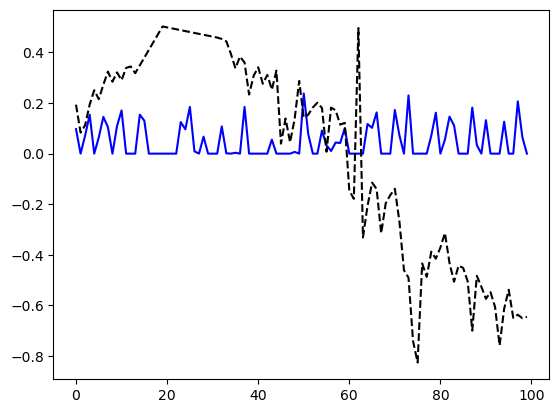

In [204]:
pred, truth = y_hat.detach().numpy(), gr.features.detach().numpy()
plt.plot(pred[0,:], 'b-')
plt.plot(truth[0,:], 'k--')
plt.show()

In [135]:
steps = []
frames = []
for mod in patterns:
    for step in range(1, nbre_steps+1):
        if step in patterns[mod]['steps'] :
            if step not in steps:
                keys = patterns[mod]['time_intervals'][patterns[mod]['steps'].index(step)]
                frames.append(data.loc[keys,])
                steps.append(step)

In [138]:
frames[50]

,MSI,LRCX,ADP,JNPR,HPQ,PTC,IPGP,NVDA,CRM,EPAM,...,VRSN,NXPI,TEL,MU,CTSH,TRMB,IBM,ACN,CSCO,PAYC
2021-04-20,0.450556,1.413325,0.923100,-0.007160,1.634977,1.882004,1.404511,0.572679,0.775113,0.930754,...,0.549173,1.224521,0.885329,1.666987,1.066339,1.366485,0.996994,0.933433,0.723434,0.892249
2021-04-21,0.478708,1.564814,0.970409,0.058551,1.718372,1.958305,1.523793,0.597996,0.829659,0.942270,...,0.606815,1.373870,1.066818,1.779565,1.028305,1.448364,1.464588,0.963842,0.744689,0.942981
2021-04-22,0.500810,1.421431,0.986809,-0.081442,1.697917,2.011842,1.472711,0.529735,0.846233,0.940401,...,0.651925,1.273619,1.013898,1.511839,1.006119,1.465984,1.267660,0.955810,0.679408,0.958383
2021-04-23,0.560138,1.490949,1.019296,-0.015731,1.800193,2.099103,1.641173,0.585254,0.891548,0.998467,...,0.619704,1.382704,1.110148,1.585772,0.969141,1.528171,1.367426,0.978474,0.741652,1.041660
2021-04-26,0.565257,1.575121,0.996587,0.058551,1.786032,2.162336,1.791158,0.613715,0.932458,1.002568,...,0.805516,1.453784,1.126130,1.687150,1.061056,1.610050,1.292819,0.946630,0.700662,1.053582
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-28,2.476073,1.992252,2.709925,3.089804,2.474239,1.045225,0.089149,2.601669,1.351834,2.349424,...,2.085439,2.025847,2.158867,1.980075,2.119255,1.797129,1.498399,2.784959,2.638603,1.227881
2021-12-29,2.544644,2.049804,2.771956,3.188971,2.479053,1.036372,0.133981,2.558704,1.332743,2.323134,...,2.211462,2.015494,2.153126,2.161239,2.210979,1.780028,1.566187,2.787124,2.704783,1.194988
2021-12-30,2.506131,2.004303,2.693618,3.075221,2.442144,1.032578,0.127189,2.503156,1.349316,2.294794,...,2.153463,1.975735,2.087110,2.033359,2.141653,1.785210,1.618912,2.764184,2.652455,1.199252
2021-12-31,2.520457,2.008734,2.726232,3.171470,2.429306,0.995060,0.123656,2.479732,1.324141,2.266515,...,2.135920,1.958755,2.114019,1.997424,2.118188,1.769145,1.595375,2.774572,2.613978,1.177410


In [139]:
# from numpy.lib.stride_tricks import sliding_window_view
# indexes = data.index
# mat = sliding_window_view(indexes, 180)[::15,:]
# mat
# # for val in mat: print(len(val))

In [44]:
fr1 = data.loc[patterns['model1']['time_intervals'][0],]

In [75]:
from scipy.spatial.distance import cosine as cos
from itertools import combinations
mes = lambda v1, v2: cos(v1, v2)/2

grap

dico = {}
dico['from'] = []
dico['to'] = []
dico['weight'] = []
thresh = .5
series = list(fr1)
values = []
for i, j in combinations(list(fr1), 2):
    val = mes(fr1[i].values.flatten(), fr1[j].values.flatten())
    values.append(val)
    if val > thresh:
        dico['from'].append(series.index(i))
        dico['to'].append(series.index(j))
        dico['weight'].append(val)
dico = pd.DataFrame(dico)

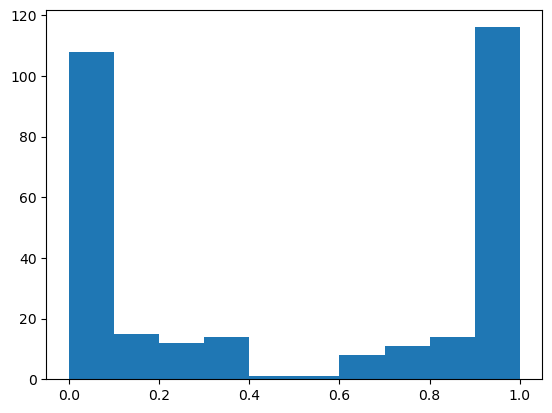

In [76]:
plt.hist(values)
plt.show()

In [81]:
evolving_graphs['1-2']['dgl_graph']

Graph(num_nodes=30, num_edges=20,
      ndata_schemes={'features': Scheme(shape=(25,), dtype=torch.float64)}
      edata_schemes={'weight': Scheme(shape=(), dtype=torch.float64)})

In [83]:
import dgl
u, v = th.tensor(dico['from']), th.tensor(dico['to'])
gr = dgl.graph((u,v), num_nodes=len(list(fr1)))

In [80]:
gr

Graph(num_nodes=25, num_edges=150,
      ndata_schemes={}
      edata_schemes={})

In [86]:
gr.ndata['features'] = th.tensor(fr1.T.values)
gr.edata['weight'] = th.tensor(dico.weight)

In [87]:
pygr = pyggraph(gr)
pygr

Data(y=[625], features=[25, 100], edges=[2, 150], weight=[150])

In [32]:
steps = list(evolving_graphs.keys())
data_train, data_test = [pyggraph(evolving_graphs[key]['dgl_graph']) for key in steps[0:-2]],\
[pyggraph(evolving_graphs[key]['dgl_graph']) for key in steps[-2:]]

In [33]:
data_train

[Data(y=[900], features=[30, 25], edges=[2, 20], weight=[20]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 9], weight=[9]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 10], weight=[10]),
 Data(y=[900], features=[30, 25], edges=[2, 10], weight=[10]),
 Data(y=[900], features=[30, 25], edges=[2, 6], weight=[6]),
 Data(y=[900], features=[30, 25], edges=[2, 11], weight=[11]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 9], weight=[9]),
 Data(y=[900], features=[30, 25], edges=[2, 10], weight=[10]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 8], weight=[8]),
 Data(y=[900], features=[30, 25], edges=[2, 9], weight=[9]),
 Data(y=[900], features=[30, 25], edges=[2, 10], weight=[10]),
 Data(y=[900

  2%|▉                                           | 1/50 [00:05<04:46,  5.84s/it]

In epoch 0, node_encoder:0.03559, node_decoder: 0.71555, edge_decoder: 1.28215, whole_loss: 2.03329



 22%|█████████▍                                 | 11/50 [01:08<04:09,  6.39s/it]

In epoch 10, node_encoder:0.00157, node_decoder: 0.71555, edge_decoder: 1.28215, whole_loss: 1.99927



 42%|██████████████████                         | 21/50 [02:11<02:58,  6.17s/it]

In epoch 20, node_encoder:0.00000, node_decoder: 0.71555, edge_decoder: 1.28215, whole_loss: 1.99770



 62%|██████████████████████████▋                | 31/50 [03:16<02:05,  6.59s/it]

In epoch 30, node_encoder:0.00000, node_decoder: 0.71472, edge_decoder: 1.28215, whole_loss: 1.99687



 82%|███████████████████████████████████▎       | 41/50 [04:21<00:58,  6.47s/it]

In epoch 40, node_encoder:0.00000, node_decoder: 0.71606, edge_decoder: 1.28215, whole_loss: 1.99821



  0%|                                                    | 0/10 [05:18<?, ?it/s]

225 225
Accuracy     0.868322
Precision    0.100000
Recall       0.806061
F-one        0.011111
dtype: float64
Accuracy     0.418981
Precision    0.033333
Recall       0.777778
F-one        0.063927
dtype: float64


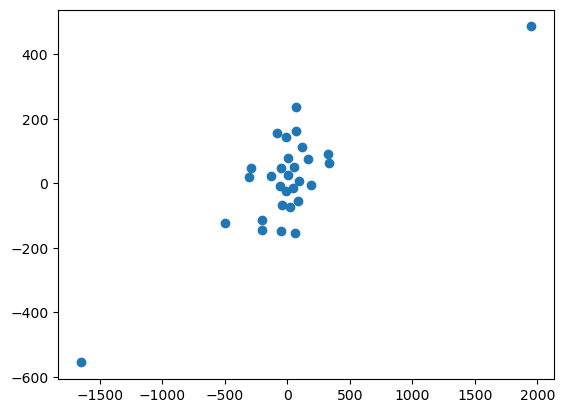

In [25]:
from sklearn.manifold import TSNE
X = evolving_graphs['1-2']['dgl_graph'].ndata['features'].numpy()

X_embedded = TSNE(n_components=2, learning_rate='auto',init='random', perplexity=3).fit_transform(X)

X_embedded
plt.scatter(X_embedded[:,0],X_embedded[:,1])
plt.show()

# evolving_graphs['1-2']['dgl_graph'].ndata['features']

In [26]:
X.shape

(30, 25)

In [13]:
list_g = []
list_feat = []
for gr in list(evolving_graphs.values())[-3:-1]:
    feat = gr.ndata['features'].to(device=device, dtype=th.float)
    list_g.append(gr)
    list_feat.append(feat)
h_node_embeddings, whole, h_node_features, h_edges = learning_results[graph_lag]['trained_model'](list_g, list_feat)


AttributeError: 'dict' object has no attribute 'ndata'

In [ ]:
testacc = {}
testacc['Node attribute'] = [learning_results[i]['test-edge'].values[0][0]*100 for i in range(2,12)]
testacc['graph lag'] = [i for i in range(2,12)]
testacc = pd.DataFrame(testacc)
testacc

In [ ]:
# testacc.plot(x = 'graph lag', y='Node attribute', style='o-')
cases = {}
for q in range(10):
    cases[q] = learning_results[q+2]['losses']['encoder'][0:800]
cases = pd.DataFrame(cases)
cases.mean(axis=1).plot()
plt.grid(True)
plt.ylabel('Average loss')
plt.xlabel('#Iterations')
# plt.legend(loc='best')
plt.show()

In [15]:
serializations = {}
for p in tqdm(range(1,11)):
    fra = getTextReview(patterns, evolving_graphs, p, data)
    serializations[p] = fra

100%|███████████████████████████████████████████| 10/10 [07:01<00:00, 42.17s/it]


In [18]:
perf = {}
perf['GPT4-f1'] = []
perf['GPT3-f1'] = []
perf['GPT4-Acc'] = []
perf['GPT3-Acc'] = []
perf['lags'] = [q for q in range(1,11)]

In [19]:
def getPrediction(frame):
    prediction = {}
    prediction['GPT3'] = []
    prediction['GPT4'] = []
    for val in frame.eventUnderwent:
        pred1 = clf1.predict([val])
        pred2 = clf2.predict([val])
        if pred1[0] == 'yes':
            prediction['GPT3'].append(1)
        else:
            prediction['GPT3'].append(0)
        if pred2[0] == 'yes':
            prediction['GPT4'].append(1)
        else:
            prediction['GPT4'].append(0) 
    return pd.DataFrame(prediction)

nbrerows = len(list(data))

for q in perf['lags']:
    clf1 = ZeroShotGPTClassifier(openai_model="gpt-3.5-turbo")
    clf2 = ZeroShotGPTClassifier(openai_model="gpt-4")
    
    # Zero shot setting
    clf1.fit(None, ['yes', 'no'])
    clf2.fit(None, ['yes', 'no'])
    serialdata = serializations[q].head(n=nbrerows)
    prediction5 = getPrediction(serialdata)
    prediction5['switchPattern'] = serialdata.switchPattern
    for mod in ['GPT3', 'GPT4']:
        f1 = f1_score(prediction5.switchPattern, prediction5[mod], average='micro')
        acc = balanced_accuracy_score(prediction5.switchPattern, prediction5[mod])
        perf[mod+'-f1'].append(np.round(f1*100, 2))
        perf[mod+'-Acc'].append(np.round(acc*100, 2))
    
perf = pd.DataFrame(perf)
perf.set_index('lags', inplace=True)

100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.00s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.00s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.00s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.00s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.00s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.05s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.10s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.08s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.05s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.05s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.10s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.08s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.10s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.05s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.08s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.07s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.08s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.10s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.10s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.11s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.13s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.11s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.16s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.05s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.03s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.06s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.04s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.14s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.09s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.12s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.13s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]

Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`



100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]


Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


100%|█████████████████████████████████████████████| 1/1 [00:09<00:00,  9.01s/it]

Could not obtain the completion after 3 retries: `APIRemovedInV1 :: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742
`


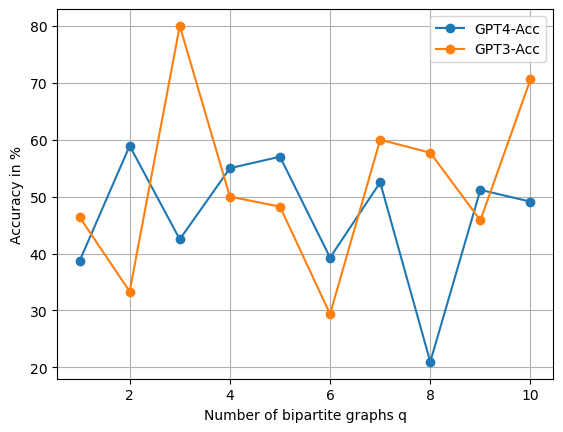

In [30]:
perf.loc[:, ['GPT4-Acc', 'GPT3-Acc']].plot(style='o-')
plt.grid(True)
plt.ylabel('Accuracy in %')
plt.xlabel('Number of bipartite graphs q')
plt.legend(loc='best')
plt.show()

In [24]:
perf

,GPT4-f1,GPT3-f1,GPT4-Acc,GPT3-Acc
lags,,,,
1,48.0,44.0,38.69,46.43
2,48.0,56.0,58.93,33.33
3,44.0,68.0,42.50,80.00
4,40.0,56.0,55.00,50.00
5,52.0,56.0,57.02,48.25
6,44.0,36.0,39.29,29.37
7,48.0,60.0,52.50,60.00
8,24.0,56.0,20.96,57.72
9,52.0,60.0,51.19,45.83


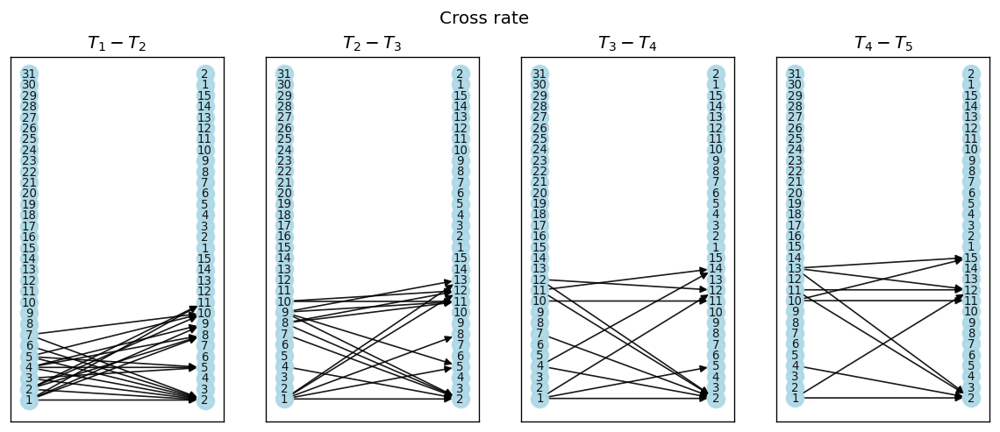

In [148]:
view_causal_relations(patterns, evolving_graphs)